# 4. MCF7 Training

In this notebook, we replicate the steps made for the HCC1806 cell line, but now for the MCF7 cell line.

In [1]:
!pip install pandas
!pip install numpy
!pip install matplotlib
!pip install seaborn
!pip install scikit-learn
!pip install scipy
!pip install xgboost
!pip install umap-learn

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import auc
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict, validation_curve, learning_curve
from sklearn.model_selection import cross_validate
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
import xgboost as xgb
from sklearn.model_selection import KFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
import umap.umap_ as umap
import plotly.express as px
import plotly.graph_objects as go
from sklearn.cluster import KMeans
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering
import scanpy as sc
from scipy.stats import mannwhitneyu
import pickle
from sklearn.neural_network import MLPClassifier

# 1. Importing the files and metadata

In [2]:
tumor = 'MCF7'

In [3]:
df_smartseq_pathHFiltNorm = f'../ai_lab/SmartSeq/{tumor}_SmartS_Filtered_Normalised_3000_Data_train.txt'
df_smartseq_HFiltNorm = pd.read_csv(df_smartseq_pathHFiltNorm, delimiter=' ')

In [4]:
df_dropseq_pathHFiltNorm = f'../ai_lab/DropSeq/{tumor}_Filtered_Normalised_3000_Data_train.txt'
df_dropseq_HFiltNorm = pd.read_csv(df_dropseq_pathHFiltNorm, delimiter=' ')

We take a look at the structure of this dataset

In [5]:
df_smartseq_HFiltNorm.head()

,output.STAR.2_B3_Norm_S57_Aligned.sortedByCoord.out.bam,output.STAR.2_B4_Norm_S58_Aligned.sortedByCoord.out.bam,output.STAR.2_B5_Norm_S59_Aligned.sortedByCoord.out.bam,output.STAR.2_B6_Norm_S60_Aligned.sortedByCoord.out.bam,output.STAR.2_B7_Hypo_S79_Aligned.sortedByCoord.out.bam,output.STAR.2_B9_Hypo_S81_Aligned.sortedByCoord.out.bam,output.STAR.2_C10_Hypo_S130_Aligned.sortedByCoord.out.bam,output.STAR.2_C11_Hypo_S131_Aligned.sortedByCoord.out.bam,output.STAR.2_C1_Norm_S103_Aligned.sortedByCoord.out.bam,output.STAR.2_C2_Norm_S104_Aligned.sortedByCoord.out.bam,...,output.STAR.4_H10_Hypo_S382_Aligned.sortedByCoord.out.bam,output.STAR.4_H14_Hypo_S383_Aligned.sortedByCoord.out.bam,output.STAR.4_H1_Norm_S355_Aligned.sortedByCoord.out.bam,output.STAR.4_H3_Norm_S357_Aligned.sortedByCoord.out.bam,output.STAR.4_H4_Norm_S358_Aligned.sortedByCoord.out.bam,output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam,output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam,output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam,output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam,output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam
CYP1B1,343,131,452,27,5817,3841,9263,21543,1013,53,...,7890,4512,160,351,327,196,504,34565,20024,5953
CYP1B1-AS1,140,59,203,7,2669,1565,3866,9113,459,22,...,3647,2035,75,138,130,102,238,13717,7835,2367
CYP1A1,0,0,0,0,0,79,238,443,0,0,...,86,1654,0,0,0,1,0,11274,563,522
NDRG1,0,1,0,0,654,1263,2634,540,0,13,...,481,1052,0,0,54,243,62,1263,925,1572
DDIT4,386,289,0,288,2484,2596,1323,2044,36,204,...,3692,2410,800,1,189,266,417,4256,12733,2275


In [6]:
df_dropseq_HFiltNorm.head()

,AAAAACCTATCG_Normoxia,AAAACAACCCTA_Normoxia,AAAACACTCTCA_Normoxia,AAAACCAGGCAC_Normoxia,AAAACCTAGCTC_Normoxia,AAAACCTCCGGG_Normoxia,AAAACTCGTTGC_Normoxia,AAAAGAGCTCTC_Normoxia,AAAAGCTAGGCG_Normoxia,AAAATCGCATTT_Normoxia,...,TTTTACAGGATC_Hypoxia,TTTTACCACGTA_Hypoxia,TTTTATGCTACG_Hypoxia,TTTTCCAGACGC_Hypoxia,TTTTCGCGCTCG_Hypoxia,TTTTCGCGTAGA_Hypoxia,TTTTCGTCCGCT_Hypoxia,TTTTCTCCGGCT_Hypoxia,TTTTGTTCAAAG_Hypoxia,TTTTTTGTATGT_Hypoxia
MALAT1,1,3,3,6,4,5,1,13,3,3,...,0,2,1,0,1,0,1,0,0,4
MT-RNR2,0,0,0,2,0,0,2,1,7,0,...,0,0,0,0,0,0,0,0,0,0
NEAT1,0,0,0,0,0,2,0,1,2,0,...,0,0,0,0,0,0,0,0,0,0
H1-5,0,0,0,0,0,2,0,0,0,0,...,0,1,0,0,1,0,0,1,0,0
TFF1,4,1,1,1,0,0,0,2,0,1,...,2,3,8,0,0,3,4,2,6,0


We then take the transpose in order to have cells as rows and features as columns and then look at the structure.

In [7]:
df_smartseq_HFiltNormT = df_smartseq_HFiltNorm.T
df_smartseq_HFiltNormT.head()

,CYP1B1,CYP1B1-AS1,CYP1A1,NDRG1,DDIT4,PFKFB3,HK2,AREG,MYBL2,ADM,...,CD27-AS1,DNAI7,MAFG,LZTR1,BCO2,GRIK5,SLC25A27,DENND5A,CDK5R1,FAM13A-AS1
output.STAR.2_B3_Norm_S57_Aligned.sortedByCoord.out.bam,343,140,0,0,386,75,0,0,476,0,...,63,0,17,59,0,0,0,51,0,0
output.STAR.2_B4_Norm_S58_Aligned.sortedByCoord.out.bam,131,59,0,1,289,42,0,856,1586,0,...,0,0,1,25,0,0,0,34,0,0
output.STAR.2_B5_Norm_S59_Aligned.sortedByCoord.out.bam,452,203,0,0,0,0,0,0,775,0,...,15,0,23,0,0,0,0,0,0,0
output.STAR.2_B6_Norm_S60_Aligned.sortedByCoord.out.bam,27,7,0,0,288,214,15,242,1191,0,...,1,0,3,10,0,0,0,4,0,0
output.STAR.2_B7_Hypo_S79_Aligned.sortedByCoord.out.bam,5817,2669,0,654,2484,1603,748,436,0,0,...,0,0,63,0,0,0,0,60,0,0


In [8]:
df_dropseq_HFiltNormT = df_dropseq_HFiltNorm.T
df_dropseq_HFiltNormT.head()

,MALAT1,MT-RNR2,NEAT1,H1-5,TFF1,MT-RNR1,H4C3,GDF15,KRT81,MT-CO3,...,MROH1,SKIDA1,MICALL1,RARG,MYO1F,BRWD1-AS2,RPS19BP1,AUNIP,TNK2,SUDS3
AAAAACCTATCG_Normoxia,1,0,0,0,4,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AAAACAACCCTA_Normoxia,3,0,0,0,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AAAACACTCTCA_Normoxia,3,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AAAACCAGGCAC_Normoxia,6,2,0,0,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AAAACCTAGCTC_Normoxia,4,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0


In [9]:
df_metaH_path = f'../ai_lab/SmartSeq/{tumor}_SmartS_MetaData.tsv'
df_metaH = pd.read_csv(df_metaH_path, delimiter='\t')
df_metaH.set_index('Filename', inplace=True)

In [10]:
def row_target(row):
    if 'Normoxia' in row.name:
        return 1
    else:
        return 0

def add_target_column_dropseq(dataframe):
    dataframe['Target'] = dataframe.apply(row_target, axis=1)
    return dataframe

In [11]:
def add_target_column_smartseq(data, metadata_path, target_column_name, target_category):
    df_meta = pd.read_csv(metadata_path, delimiter='\t')
    df_meta.set_index('Filename', inplace=True)
    merged_transition = pd.merge(data, df_meta[target_column_name], left_index=True, right_index=True)
    dummy_variables = pd.get_dummies(merged_transition[target_column_name], prefix='category').astype('int')
    
    # Set the target category to 1 and the others to 0
    dummy_variables['Target'] = dummy_variables[target_category]
    dummy_variables.drop(columns=[col for col in dummy_variables.columns if col != 'Target'], inplace=True)
    
    merged_data = pd.concat([merged_transition, dummy_variables], axis=1)
    merged_data.drop(columns=[target_column_name], inplace=True)
    print
    return merged_data

In [12]:
merged_smartseq = add_target_column_smartseq(df_smartseq_HFiltNormT, df_metaH_path, 'Condition', 'category_Norm')

In [13]:
merged_dropseq = add_target_column_dropseq(df_dropseq_HFiltNormT)

In [14]:
merged_smartseq.head()

,CYP1B1,CYP1B1-AS1,CYP1A1,NDRG1,DDIT4,PFKFB3,HK2,AREG,MYBL2,ADM,...,DNAI7,MAFG,LZTR1,BCO2,GRIK5,SLC25A27,DENND5A,CDK5R1,FAM13A-AS1,Target
output.STAR.2_B3_Norm_S57_Aligned.sortedByCoord.out.bam,343,140,0,0,386,75,0,0,476,0,...,0,17,59,0,0,0,51,0,0,1
output.STAR.2_B4_Norm_S58_Aligned.sortedByCoord.out.bam,131,59,0,1,289,42,0,856,1586,0,...,0,1,25,0,0,0,34,0,0,1
output.STAR.2_B5_Norm_S59_Aligned.sortedByCoord.out.bam,452,203,0,0,0,0,0,0,775,0,...,0,23,0,0,0,0,0,0,0,1
output.STAR.2_B6_Norm_S60_Aligned.sortedByCoord.out.bam,27,7,0,0,288,214,15,242,1191,0,...,0,3,10,0,0,0,4,0,0,1
output.STAR.2_B7_Hypo_S79_Aligned.sortedByCoord.out.bam,5817,2669,0,654,2484,1603,748,436,0,0,...,0,63,0,0,0,0,60,0,0,0


In [15]:
merged_dropseq.head()

,MALAT1,MT-RNR2,NEAT1,H1-5,TFF1,MT-RNR1,H4C3,GDF15,KRT81,MT-CO3,...,SKIDA1,MICALL1,RARG,MYO1F,BRWD1-AS2,RPS19BP1,AUNIP,TNK2,SUDS3,Target
AAAAACCTATCG_Normoxia,1,0,0,0,4,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
AAAACAACCCTA_Normoxia,3,0,0,0,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
AAAACACTCTCA_Normoxia,3,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
AAAACCAGGCAC_Normoxia,6,2,0,0,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
AAAACCTAGCTC_Normoxia,4,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1


# 2. Dimensionality reduction

In [16]:
# # in order to speed up the process, we can simply import the datasets from our stored pickle files:
# with open(f"pickle/{tumor}/dataset_smartseq", 'rb') as f:
#     dataset_smartseq = pickle.load(f)
# with open(f"pickle/{tumor}/dataset_dropseq", 'rb') as f:
#     dataset_dropseq = pickle.load(f)

### Principal component analysis

In [18]:
def pca_dr(dataset):
    # we rescale the data for the dimensionality reduction
    df_dim_red = pd.DataFrame(StandardScaler().fit_transform(dataset), columns=dataset.columns, index=dataset.index)
    pca = PCA()
    pca_array = pca.fit_transform(df_dim_red)
    pca_array_df = pd.DataFrame(pca_array, columns=[f'PC{i+1}' for i in range(pca_array.shape[1])], index=df_dim_red.index)
    cumsum = np.cumsum(pca.explained_variance_ratio_)
    plt.plot(cumsum)
    nec_dimensions = np.argmax(cumsum >= 0.95)
    plt.scatter(nec_dimensions, 0.95, color='red')
    plt.plot([nec_dimensions, nec_dimensions], [0, 0.95], linestyle='--', color='black')
    plt.plot([0, nec_dimensions], [0.95, 0.95], linestyle='--', color='black')
    print(f"The number of dimensions needed to explain 95% of the variance is {nec_dimensions}")
    pca_array_df = pca_array_df[[f'PC{i+1}' for i in range(nec_dimensions)]]
    return pca_array_df, nec_dimensions

The number of dimensions needed to explain 95% of the variance is 204


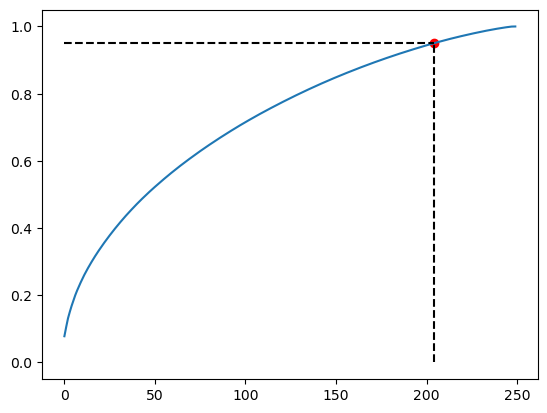

In [20]:
smartseq_pca, smartseq_dimensions = pca_dr(df_smartseq_HFiltNormT)
smartseq_pca = add_target_column_smartseq(smartseq_pca, df_metaH_path, 'Condition', 'category_Norm')

The number of dimensions needed to explain 95% of the variance is 2653


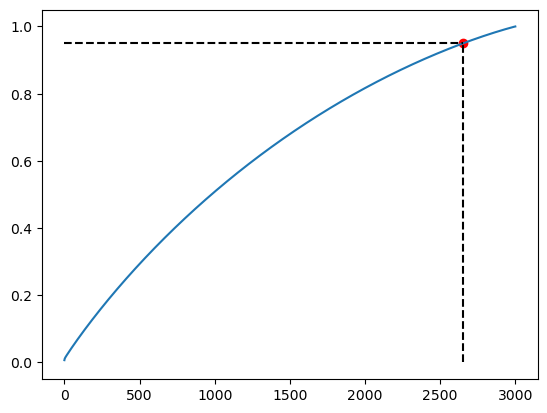

In [21]:
dropseq_pca, dropseq_dimensions = pca_dr(df_dropseq_HFiltNormT)
dropseq_pca = add_target_column_dropseq(dropseq_pca)

In [22]:
dropseq_zero_perc = np.count_nonzero(df_smartseq_HFiltNormT.values == 0) / df_smartseq_HFiltNormT.size
smartseq_zero_perc = np.count_nonzero(df_dropseq_HFiltNormT.values == 0) / df_dropseq_HFiltNormT.size

print(f"Percentage of zeros in the DropSeq dataset: {dropseq_zero_perc}")
print(f"Percentage of zeros in the SmartSeq dataset: {smartseq_zero_perc}")

Percentage of zeros in the DropSeq dataset: 0.6362213333333333
Percentage of zeros in the SmartSeq dataset: 0.9751067748834177


### UMAP (Uniform Manifold Approximation and Projection).

In [23]:
def umap_dr(dataset, dropseq=False):
    df_dim_red = pd.DataFrame(StandardScaler().fit_transform(dataset), columns=dataset.columns, index=dataset.index)
    if dropseq:
        nec_dimensions = dropseq_dimensions
    else:
        nec_dimensions = smartseq_dimensions
    reducer = umap.UMAP(n_components=nec_dimensions, n_neighbors=50)
    embedding = reducer.fit_transform(df_dim_red)
    columns = [f'UMAP{i+1}' for i in range(embedding.shape[1])]
    umap_embedding_df = pd.DataFrame(embedding, columns=columns, index=df_dim_red.index)
    
    return umap_embedding_df

In [24]:
smartseq_umap = umap_dr(df_smartseq_HFiltNormT, False)
smartseq_umap = add_target_column_smartseq(smartseq_umap, df_metaH_path, 'Condition', 'category_Norm')

In [25]:
smartseq_umap.head()

,UMAP1,UMAP2,UMAP3,UMAP4,UMAP5,UMAP6,UMAP7,UMAP8,UMAP9,UMAP10,...,UMAP196,UMAP197,UMAP198,UMAP199,UMAP200,UMAP201,UMAP202,UMAP203,UMAP204,Target
output.STAR.2_B3_Norm_S57_Aligned.sortedByCoord.out.bam,4.774703,4.155952,4.898251,3.169567,7.051502,6.985627,6.547235,3.139618,6.946844,7.031439,...,4.810780,5.006242,4.256685,5.235156,6.836561,5.126673,5.702577,4.109409,5.217831,1
output.STAR.2_B4_Norm_S58_Aligned.sortedByCoord.out.bam,4.697414,4.253233,4.867404,2.994931,6.957909,7.116072,6.529574,3.159295,6.874466,7.049583,...,4.895353,5.164134,4.351203,5.130058,7.079482,5.247562,5.736913,4.033299,5.274473,1
output.STAR.2_B5_Norm_S59_Aligned.sortedByCoord.out.bam,4.724511,4.162519,4.970907,3.112639,6.977691,6.989295,6.482792,3.191815,6.957374,7.157264,...,4.857417,5.118926,4.233070,5.255074,6.938803,5.057361,5.839932,3.960775,5.274864,1
output.STAR.2_B6_Norm_S60_Aligned.sortedByCoord.out.bam,4.645276,4.231000,4.880652,3.002295,7.023160,7.022811,6.477791,3.170572,6.965165,7.103217,...,4.959548,5.036103,4.380265,5.019602,7.128963,4.927063,5.814390,3.950458,5.256153,1
output.STAR.2_B7_Hypo_S79_Aligned.sortedByCoord.out.bam,4.589056,4.324624,4.618593,2.854101,6.924154,7.028948,6.304656,3.206816,6.817308,6.983927,...,5.049794,4.694594,4.644853,4.805018,7.215852,4.908075,5.688462,3.977931,5.241772,0


In [26]:
dropseq_umap = umap_dr(df_dropseq_HFiltNormT, True)
dropseq_umap = add_target_column_dropseq(dropseq_umap)

In [27]:
dropseq_umap.head()

,UMAP1,UMAP2,UMAP3,UMAP4,UMAP5,UMAP6,UMAP7,UMAP8,UMAP9,UMAP10,...,UMAP2645,UMAP2646,UMAP2647,UMAP2648,UMAP2649,UMAP2650,UMAP2651,UMAP2652,UMAP2653,Target
AAAAACCTATCG_Normoxia,3.630101,9.791685,8.786524,9.835941,8.700043,9.476537,0.159239,9.599207,2.207427,9.101202,...,3.929533,3.022483,4.637803,4.584964,5.643712,4.356299,5.883782,3.795696,4.380228,1
AAAACAACCCTA_Normoxia,3.201334,9.799476,8.890107,9.896137,8.750347,9.500980,0.166188,9.556158,2.169933,9.127977,...,3.875372,2.994319,4.597602,4.534465,5.635926,4.318342,5.966429,3.776810,4.415721,1
AAAACACTCTCA_Normoxia,3.225432,9.796381,8.876361,9.892301,8.741547,9.503974,0.165218,9.554548,2.173542,9.129963,...,3.876256,2.995048,4.594262,4.548397,5.639113,4.322341,5.973910,3.784692,4.410368,1
AAAACCAGGCAC_Normoxia,3.287647,9.786806,8.825932,9.867825,8.712653,9.504280,0.143120,9.552670,2.194671,9.128667,...,3.904514,2.976239,4.615034,4.608028,5.712839,4.334010,5.958848,3.813216,4.402596,1
AAAACCTAGCTC_Normoxia,3.216100,9.796724,8.849429,9.880158,8.725588,9.507630,0.157217,9.555683,2.184198,9.125715,...,3.875923,3.002241,4.602890,4.559289,5.655152,4.332308,5.976750,3.796412,4.403620,1


In [28]:
dataset_smartseq = {}
dataset_smartseq['merged dataset'] = merged_smartseq
dataset_smartseq['PCA dataset'] = smartseq_pca
dataset_smartseq['UMAP dataset'] = smartseq_umap

In [29]:
dataset_dropseq = {}
dataset_dropseq['merged dataset'] = merged_dropseq
dataset_dropseq['PCA dataset'] = dropseq_pca
dataset_dropseq['UMAP dataset'] = dropseq_umap

In [31]:
filename = f"pickle/{tumor}/dataset_smartseq"
with open(filename, 'wb') as f:
    pickle.dump(dataset_smartseq, f)

In [32]:
filename = f"pickle/{tumor}/dataset_dropseq"
with open(filename, 'wb') as f:
    pickle.dump(dataset_dropseq, f)

# 3. Feature selection

In [17]:
def filter_CPM(data, threshold):
    data_filtered = pd.DataFrame()
    # Keep track of the number of rows removed
    removed_genes = 0
    # Create a mask to filter out rows with low counts
    if 'Target' in data.index:
        data = data.drop('Target')
    mask_thr = data > threshold
    mask_rows = mask_thr.sum(axis=1) >= 2
    data_filtered = data.loc[mask_rows, :]
    return data_filtered

In [18]:
def wilcoxon_ranksum_test(data):
    normo = data[data["Target"] == 0]
    hypo = data[data["Target"] == 1]
    p_values = {}
    for i in range(data.shape[1]):
        p_values[data.columns[i]] = mannwhitneyu(normo.iloc[:, i], hypo.iloc[:, i], alternative = "two-sided")[1]
    return p_values

In [19]:
def q_value (p_val_dict):
  sorted_list = [[key, value] for (key, value) in sorted(p_val_dict.items(), key=lambda x: x[1])]
  rank = 1
  for p in sorted_list:
    p[1] = p[1] * len(p_val_dict)/rank
    rank += 1
  q_val_dict = dict(sorted_list)
  q_val_dict = (sorted(q_val_dict.items()))
  return q_val_dict

In [20]:
def grid_search_thresholds(data, thresholds, smartseq=True):
    n_features = []
    for threshold in thresholds:
        data_filtered = filter_CPM(data, threshold)
        data_filtered = data_filtered.T
        print("Number of features dropped for CPM", threshold, ":", data.shape[0]-data_filtered.shape[1])
        if smartseq:
            data_filtered = add_target_column_smartseq(data_filtered, df_metaH_path, 'Condition', 'category_Norm')
        else:
            data_filtered = add_target_column_dropseq(data_filtered)
        p_vals = wilcoxon_ranksum_test(data_filtered)
        count = [value for value in q_value(p_vals) if value[1] <= 0.05]
        count = [value[0] for value in count]
        # Delete all columns in count that are not in colsdatafilt
        finaldf = data_filtered[count]
        print("Number of features dropped after q-value test for threshold", threshold, ":", data_filtered.shape[1]-len(count))
        n_features.append(finaldf.shape[1])
        # Plot the number of features we drop for each treshold value
    plt.plot(thresholds, n_features)
    plt.xlabel('Threshold')
    plt.ylabel('Number of features')
    plt.title('Number of significant features for each threshold value')
    plt.axvline(x=30, color = "red", linestyle = "--", label = "Optimal Threshold")
    plt.legend()
    plt.show()  
    return n_features

In [21]:
def scatter_plot_variance(dataset, threshold):
    filt_first = filter_CPM(dataset.T, threshold).T
    adata = sc.AnnData(filt_first)

    sc.pp.highly_variable_genes(adata, n_top_genes=200, flavor='seurat_v3')
    # Note since our dataset is already log-transformed as the function 'Expects logarithmized data'
    sc.pl.highly_variable_genes(adata)

In [22]:
def filtering(dataset, threshold, smartseq=True):
    datasetT = dataset.T
    filteredcpm = filter_CPM(datasetT, threshold)
    print(filteredcpm)
    print("Number of rows before filtering:", datasetT.shape[0])

    p_values_mannwhitneyu = wilcoxon_ranksum_test(merged_smartseq)

    thresholds = np.linspace(start = 10, stop = 100, num = 10)
    nfeatures = grid_search_thresholds(datasetT, thresholds, smartseq)

    merged_filtered = filter_CPM(datasetT, threshold)
    merged_filtered = merged_filtered.T
    if smartseq:
        merged_filtered = add_target_column_smartseq(merged_filtered, df_metaH_path, 'Condition', 'category_Norm')
    else:
        merged_filtered = add_target_column_dropseq(merged_filtered)
    pvals = wilcoxon_ranksum_test(merged_filtered)
    qvals = q_value(pvals)
    count = [value for value in qvals if value[1] <= 0.05]
    count = [value[0] for value in count]
    merged_filtered = merged_filtered[count]

    print(merged_filtered.shape)

            output.STAR.2_B3_Norm_S57_Aligned.sortedByCoord.out.bam  \
CYP1B1                                                    343         
CYP1B1-AS1                                                140         
CYP1A1                                                      0         
NDRG1                                                       0         
DDIT4                                                     386         
...                                                       ...         
MAFG                                                       17         
LZTR1                                                      59         
DENND5A                                                    51         
CDK5R1                                                      0         
FAM13A-AS1                                                  0         

            output.STAR.2_B4_Norm_S58_Aligned.sortedByCoord.out.bam  \
CYP1B1                                                    131         
CYP1B

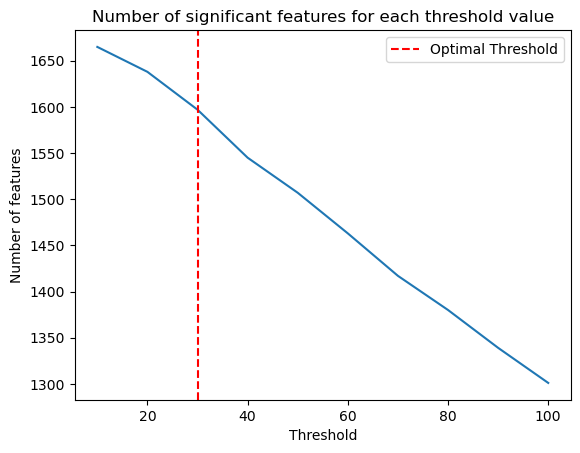

(250, 1597)


In [23]:
filtering(df_smartseq_HFiltNormT, 30)

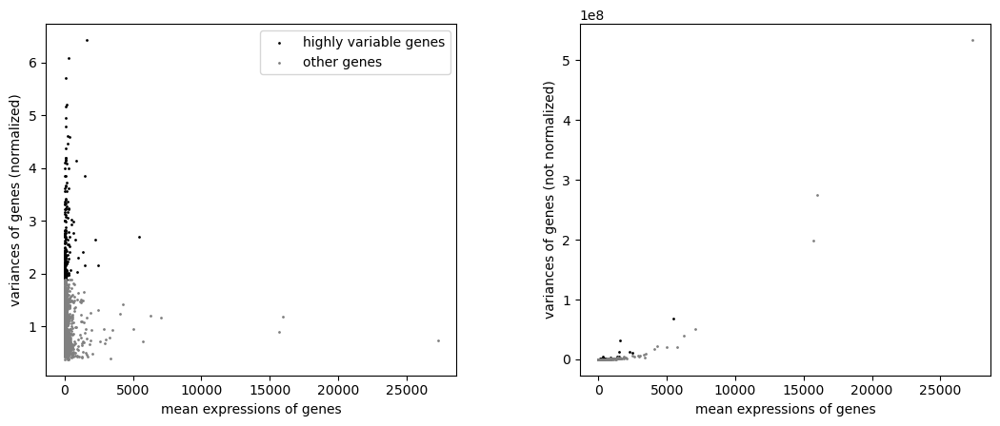

In [24]:
scatter_plot_variance(df_smartseq_HFiltNormT, threshold=30)

# 4. Unsupervised learning

### K means clustering

In [25]:
data_scaled_smartseq = pd.DataFrame(StandardScaler().fit_transform(df_smartseq_HFiltNormT), columns=df_smartseq_HFiltNormT.columns)
data_scaled_dropseq = pd.DataFrame(StandardScaler().fit_transform(df_dropseq_HFiltNormT), columns=df_dropseq_HFiltNormT.columns)

def k_means_clustering(data_scaled):
    # Perform KMeans clustering
    kmeans = KMeans(n_clusters=2, random_state=42)
    cluster_labels = kmeans.fit_predict(data_scaled)
    str_labels = [str(label) for label in cluster_labels]
    data_scaled ['c']= cluster_labels

    # Perform PCA to reduce the data to 3 dimensions, so that it can be visualized
    pca = PCA(n_components=3)
    pca_result = pca.fit_transform(data_scaled)

    # Create DataFrame for clustered data
    df_clustered = pd.DataFrame({
        'PC1': pca_result[:, 0],
        'PC2': pca_result[:, 1],
        'PC3': pca_result[:, 2],
        'Cluster': str_labels
    })

    return df_clustered

def plot_clusters(df_clustered):
    fig = px.scatter_3d(df_clustered, x='PC1', y='PC2', z='PC3', color='Cluster',
                        symbol='Cluster', opacity=0.7, size_max=10,
                        title='KMeans Clustering in 3D with PCA')

    fig.show()

In [26]:
k_means_smartseq = k_means_clustering(data_scaled_smartseq)
plot_clusters(k_means_smartseq)

In [27]:
k_means_dropseq = k_means_clustering(data_scaled_dropseq)
plot_clusters(k_means_dropseq)

### Hierarchical clustering:

In [28]:
def hierarchical_clustering(data_scaled):
    # Define linkage methods
    methods = ['ward', 'complete', 'average', 'median']

    # Perform PCA to reduce the data to 3 dimensions, so that it can be visualized
    pca = PCA(n_components=3)
    pca_result = pca.fit_transform(data_scaled)

    # Plot dendrograms for each linkage method
    plt.figure(figsize=(15, 10))
    for i, method in enumerate(methods, 1):
        plt.subplot(2, 2, i)
        linked = linkage(pca_result, method=method)
        dendrogram(linked, distance_sort='descending', truncate_mode='level', p=5)
        plt.title(f'Hierarchical Clustering Dendrogram ({method.capitalize()} Linkage)')
        plt.xlabel('Data points')
        plt.ylabel('Distance')

    
    plt.tight_layout()
    plt.show()

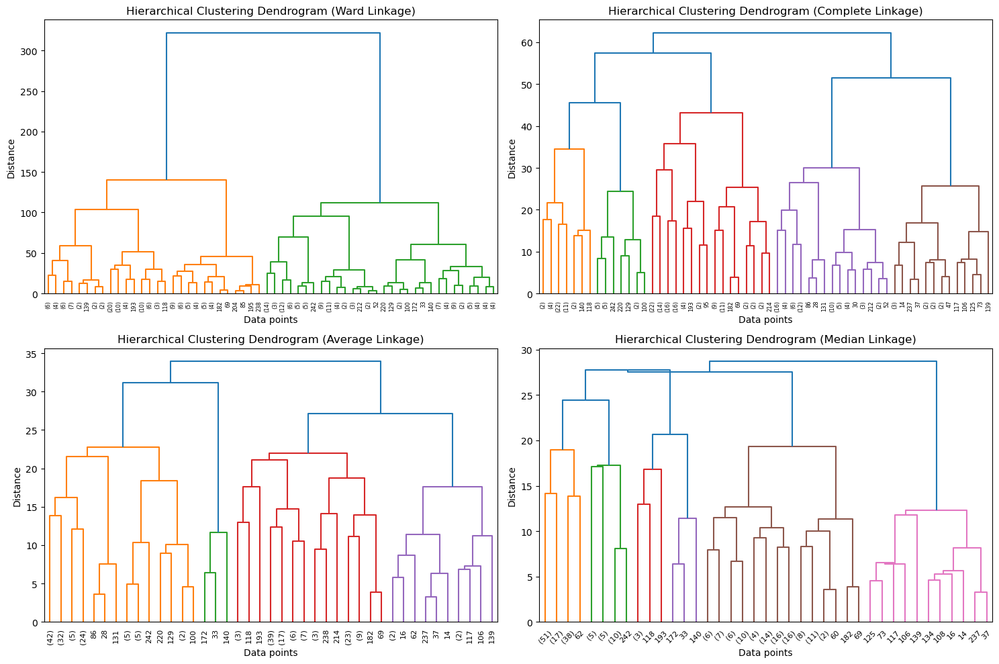

In [29]:
hierarchical_clustering(data_scaled_smartseq)

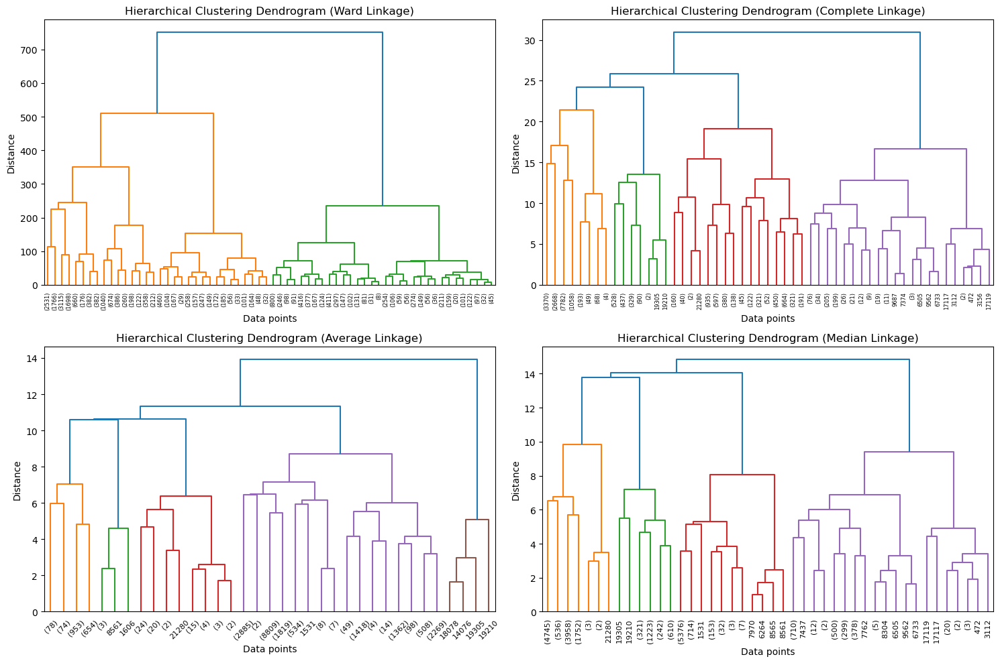

In [30]:
hierarchical_clustering(data_scaled_dropseq)

# 5. Supervised learning

In [31]:
def load_dataset(dataset):
    X = dataset.drop(columns=['Target'])
    y = dataset['Target']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)
    kfold = KFold(n_splits=5, shuffle=True, random_state=123)
    return X, y, X_train, X_test, y_train, y_test, kfold

In [32]:
def plot_confusion_matrix(model, name):
    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(model['confusion_matrix'], annot=True, fmt="d", cmap="Blues", cbar=False)
    plt.xlabel("Predicted labels")
    plt.ylabel("True labels")
    plt.title(f"Confusion Matrix - {name}")
    plt.show()

### XGBoost

In [39]:
def run_xgboost(dataset):
    X, y, X_train, X_test, y_train, y_test, kfold = load_dataset(dataset)
    retval = {}
    retval['dataset'] = dataset
    retval['name'] = 'XGboost'

    # Define the parameter grid
    param_grid = {
        'max_depth': range(3, 10),
        'learning_rate': np.linspace(0.1, 1, 10),
        'n_estimators': range(10, 110, 10),
        'gamma': np.linspace(0, 0.5, 5),
        'subsample': np.linspace(0.5, 1, 6),
        'colsample_bytree': np.linspace(0.5, 1, 6),
        'min_child_weight': range(1, 6),
        'scale_pos_weight': range(1, 6)
    }

    xg_cl = XGBClassifier()


    # Instantiate RandomizedSearchCV
    random_search = RandomizedSearchCV(xg_cl, param_distributions=param_grid, n_iter=50, scoring='accuracy',
                                        n_jobs=-1, cv=kfold, random_state=123)

    # Fit the model
    random_search.fit(X, y)

    # Print/return the best parameters
    retval['parameters'] = random_search.best_params_

    #Now we implement the best model
    xgb_optm = xgb.XGBClassifier(objective='binary:logistic', **random_search.best_params_)
    
    # Train the model
    xgb_optm.fit(X_train, y_train)
    retval['model'] = xgb_optm

    # Make predictions on the test set
    xgb_predictions = xgb_optm.predict(X_test)
    retval['predictions'] = xgb_predictions

    # Calculate accuracy
    accuracy = accuracy_score(y_test, xgb_predictions)
    
    # Perform k-fold cross-validation
    cv_results = cross_val_score(xgb_optm, X, y, cv=kfold, scoring='accuracy')
    retval['accuracy'] = cv_results.mean()

    # Create confusion matrix
    conf_matrix = confusion_matrix(y_test, xgb_predictions)
    retval['confusion_matrix'] = conf_matrix

    #Calculate Precision
    prec = precision_score(y_test, xgb_predictions)
    retval['precision'] = prec

    #Calculate Recall
    rec = recall_score(y_test, xgb_predictions)
    retval['recall'] = rec
    
    #Calculate F1 score
    f1 = f1_score(y_test, xgb_predictions)
    retval['f1'] = f1

    #Calculate AUC
    auc = roc_auc_score(y_test, xgb_predictions)
    retval['auc'] = auc

    return retval

In [40]:
def plot_feature_importance(model):
    # Plot feature importance
    plt.figure(figsize=(10, 6))
    xgb.plot_importance(model['model'], max_num_features=200)
    plt.title("Feature Importance")
    plt.show()

merged dataset


/Users/edoardoghirardo/miniconda/envs/edo/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.



Accuracy: 0.9960000000000001


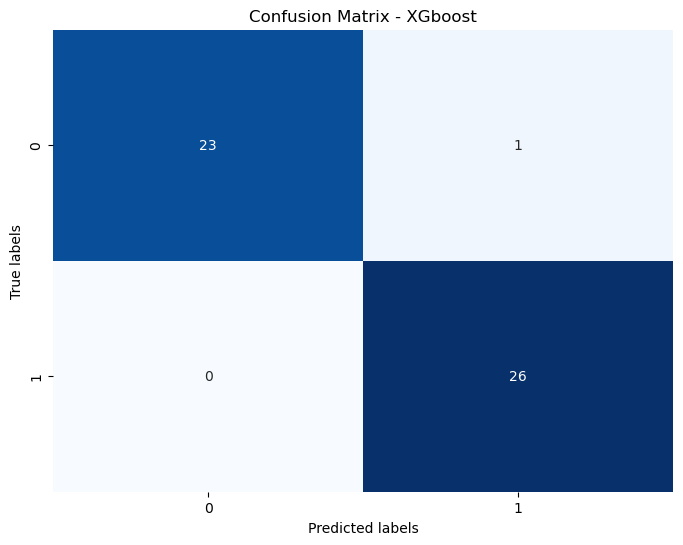

<Figure size 1000x600 with 0 Axes>

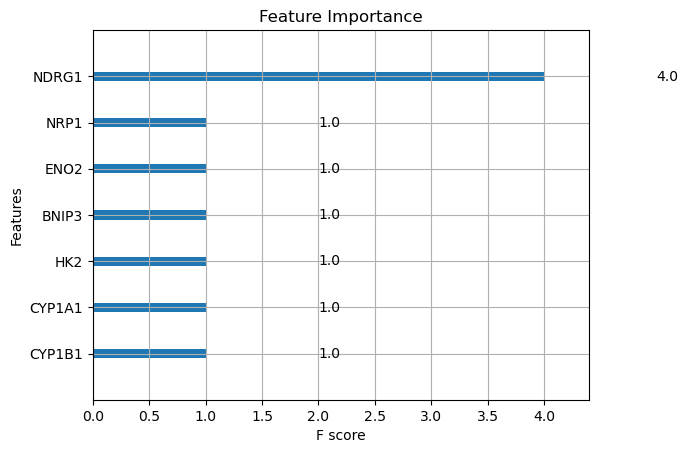

PCA dataset


/Users/edoardoghirardo/miniconda/envs/edo/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.



Accuracy: 0.9800000000000001


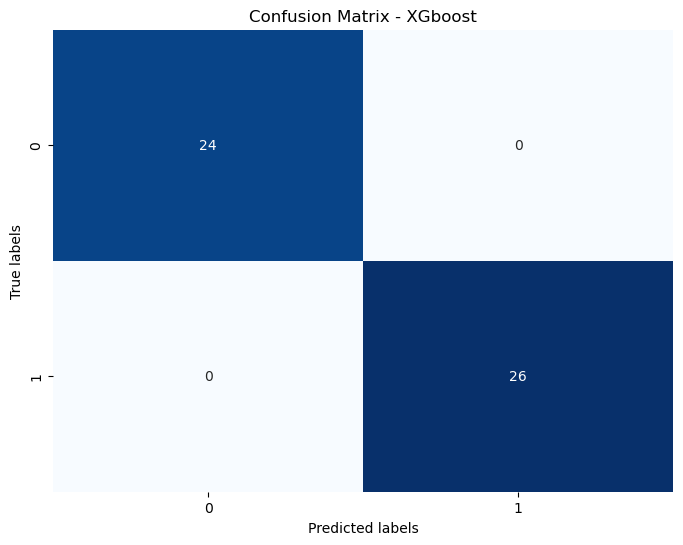

<Figure size 1000x600 with 0 Axes>

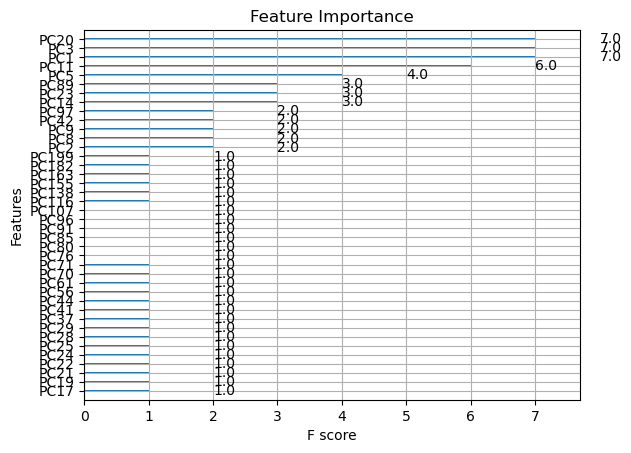

UMAP dataset
Accuracy: 0.9960000000000001


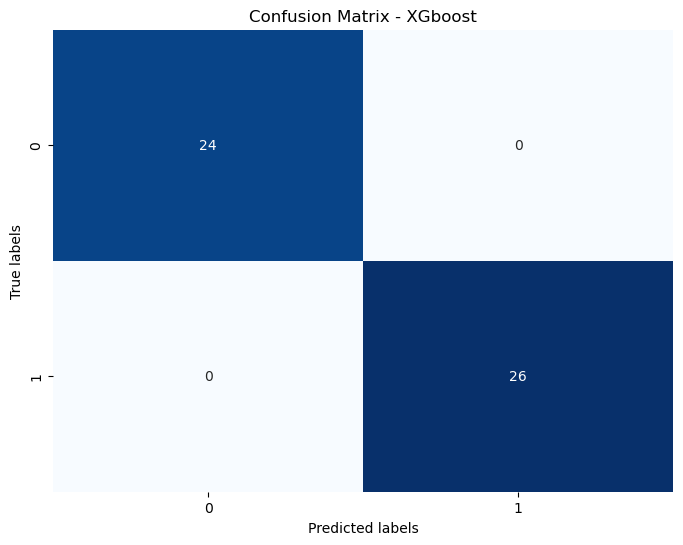

<Figure size 1000x600 with 0 Axes>

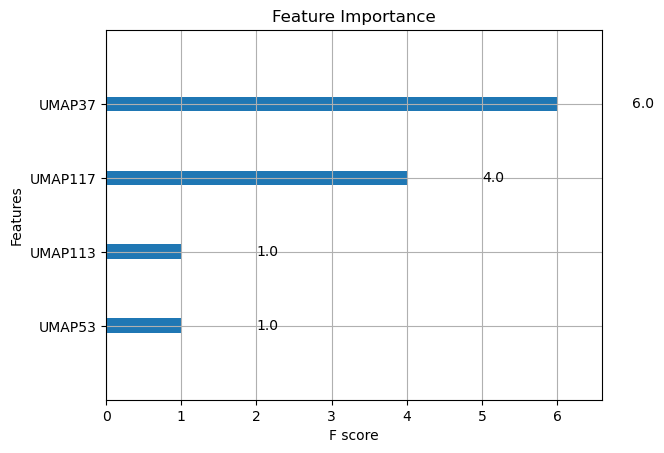

In [41]:
for x in dataset_smartseq.keys():
    print(x)
    xgboost_smartseq = run_xgboost(dataset_smartseq[x])
    # dump the model to save it
    filename = f"pickle/{tumor}/xgboost/smartseq_{x}"
    with open(filename, 'wb') as f:
        pickle.dump(xgboost_smartseq, f)
    print(f"Accuracy: {xgboost_smartseq['accuracy']}")
    plot_confusion_matrix(xgboost_smartseq, xgboost_smartseq['name'])
    plot_feature_importance(xgboost_smartseq)

merged dataset


/Users/edoardoghirardo/miniconda/envs/edo/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.



Accuracy: 0.9822898938799943


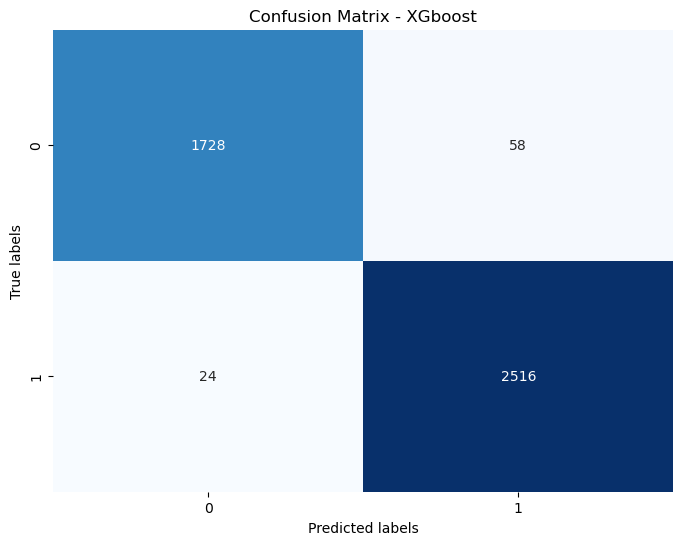

<Figure size 1000x600 with 0 Axes>

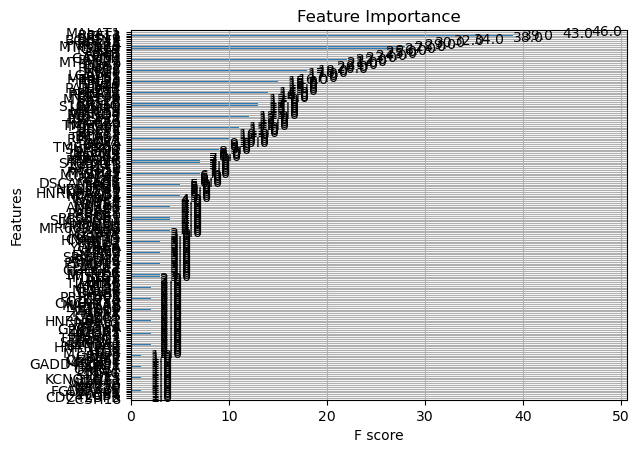

PCA dataset


/Users/edoardoghirardo/miniconda/envs/edo/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.



Accuracy: 0.9891796610894203


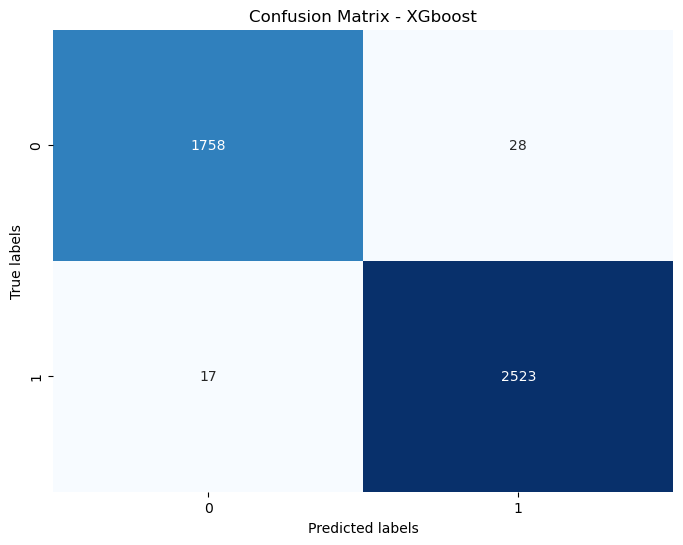

<Figure size 1000x600 with 0 Axes>

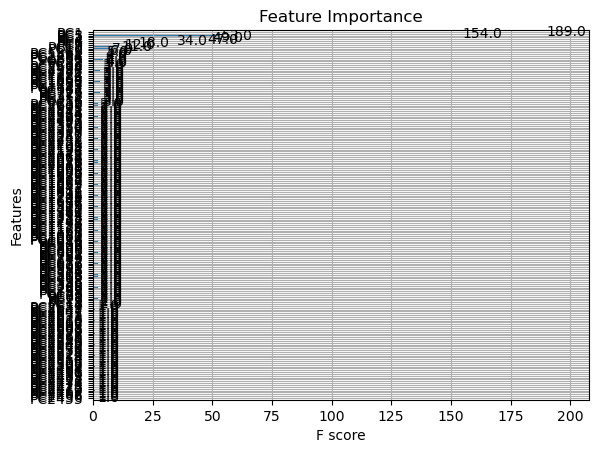

UMAP dataset


/Users/edoardoghirardo/miniconda/envs/edo/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.



Accuracy: 0.9157959160767399


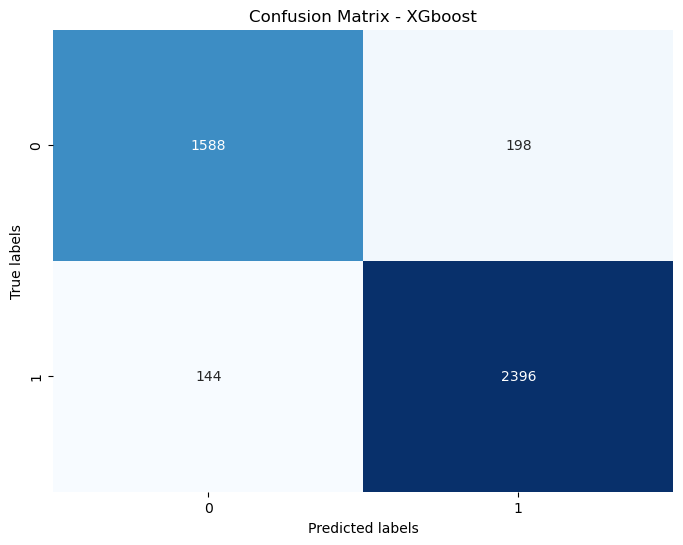

<Figure size 1000x600 with 0 Axes>

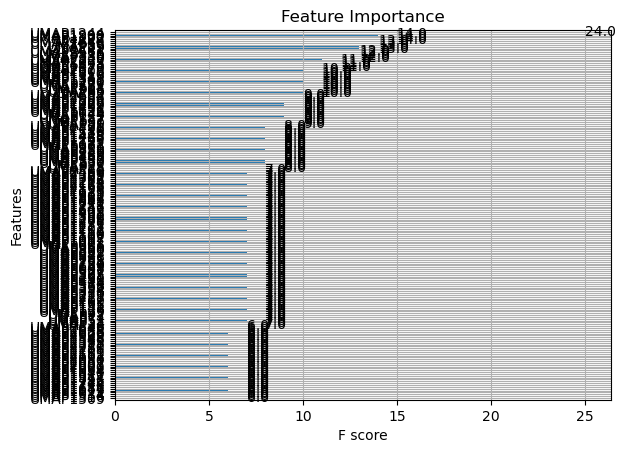

In [42]:
for x in dataset_dropseq.keys():
    print(x)
    xgboost_dropseq = run_xgboost(dataset_dropseq[x])
    filename = f"pickle/{tumor}/xgboost/dropseq_{x}"
    with open(filename, 'wb') as f:
        pickle.dump(xgboost_dropseq, f)
    print(f"Accuracy: {xgboost_dropseq['accuracy']}")
    plot_confusion_matrix(xgboost_dropseq, xgboost_dropseq['name'])
    plot_feature_importance(xgboost_dropseq)

### K-Nearest Neighbors (KNN).

In [43]:
def run_kneighbors(dataset):
    X, y, X_train, X_test, y_train, y_test, kfold = load_dataset(dataset)
    retval = {}
    retval['dataset'] = dataset
    retval['name'] = 'KNN'
    
    param_grid = {
        'n_neighbors': range(1, 20),
        'weights': ['uniform', 'distance'],
        'metric': ['euclidean', 'manhattan', 'minkowski']
    }

    knn = KNeighborsClassifier()

    # Instantiate Gridsearch
    grid_search = GridSearchCV(knn, param_grid=param_grid, scoring='accuracy',
                            n_jobs=-1, cv=kfold)

    # Fit the model
    grid_search.fit(X, y)

    # return the best parameters
    retval['parameters'] = grid_search.best_params_

    knn_optm = KNeighborsClassifier(**grid_search.best_params_)

    # Train the KNN classifier
    knn_optm.fit(X_train, y_train)
    retval['model'] = knn_optm

    # Make predictions on the test set
    knn_predictions = knn_optm.predict(X_test)
    retval['predictions'] = knn_predictions

    # Calculate accuracy (actually, we will use the mean accuracy computed with cross validation)
    accuracy = accuracy_score(y_test, knn_predictions)

    # Perform k-fold cross-validation
    cv_results = cross_val_score(knn_optm, X, y, cv=kfold, scoring='accuracy')
    retval['accuracy'] = cv_results.mean()

    # Create confusion matrix
    conf_matrix = confusion_matrix(y_test, knn_predictions)
    retval['confusion_matrix'] = conf_matrix

    #Calculate Precision
    prec = precision_score(y_test, knn_predictions)
    retval['precision'] = prec

    #Calculate Recall
    rec = recall_score(y_test, knn_predictions)
    retval['recall'] = rec
    
    #Calculate F1 score
    f1 = f1_score(y_test, knn_predictions)
    retval['f1'] = f1

    #Calculate AUC
    auc = roc_auc_score(y_test, knn_predictions)
    retval['auc'] = auc

    return retval

merged dataset
Accuracy: 0.9960000000000001


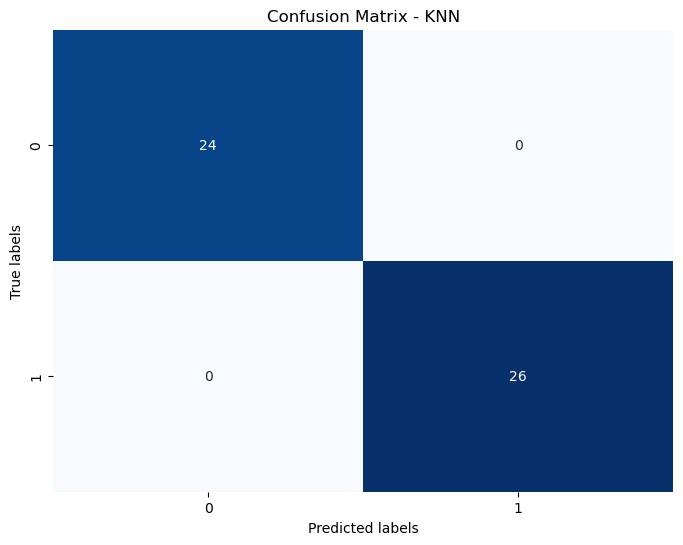

PCA dataset
Accuracy: 0.9960000000000001


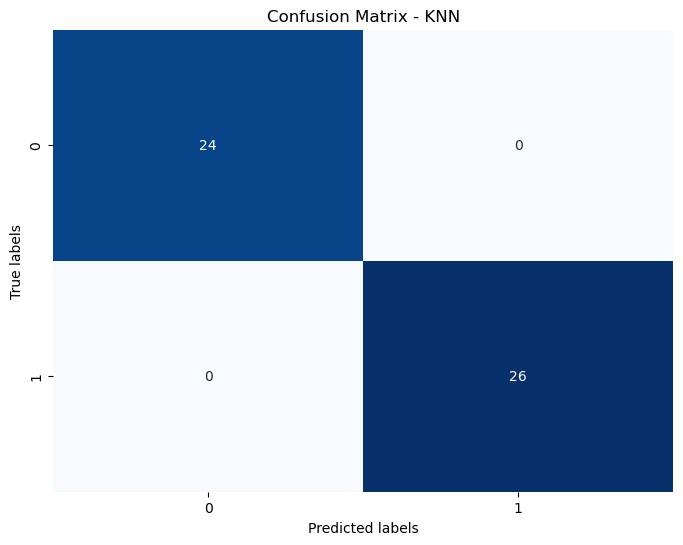

UMAP dataset
Accuracy: 0.9960000000000001


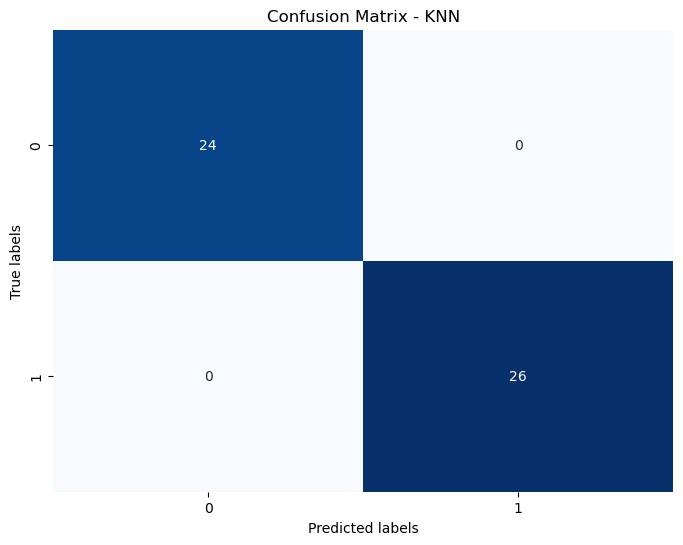

In [44]:
for x in dataset_smartseq.keys():
    print(x)
    kneighbors_smartseq = run_kneighbors(dataset_smartseq[x])
    filename = f"pickle/{tumor}/knn/smartseq_{x}"
    with open(filename, 'wb') as f:
        pickle.dump(kneighbors_smartseq, f)
    print(f"Accuracy: {kneighbors_smartseq['accuracy']}")
    plot_confusion_matrix(kneighbors_smartseq, kneighbors_smartseq['name'])


We now plot the most important genes to visualize what the knn boundary might be in 3 dimensions.

Text(0.5, 0.92, '3D Scatter plot of two genes')

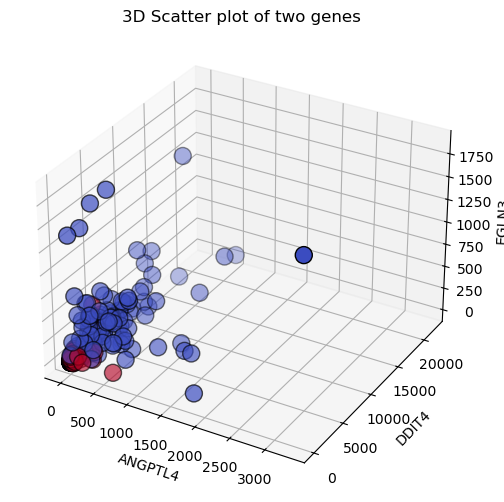

In [45]:
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot
X, y, X_train, X_test, y_train, y_test, kfold = load_dataset(dataset_smartseq['merged dataset'])
scatter = ax.scatter(X['ANGPTL4'], X['DDIT4'], X['EGLN3'], c=y, cmap='coolwarm', edgecolor='k', s=150)

# Set labels and title
ax.set_xlabel('ANGPTL4')
ax.set_ylabel('DDIT4')
ax.set_zlabel('EGLN3')
ax.set_title('3D Scatter plot of two genes')

merged dataset


/Users/edoardoghirardo/miniconda/envs/edo/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.



Accuracy: 0.8981787872228413


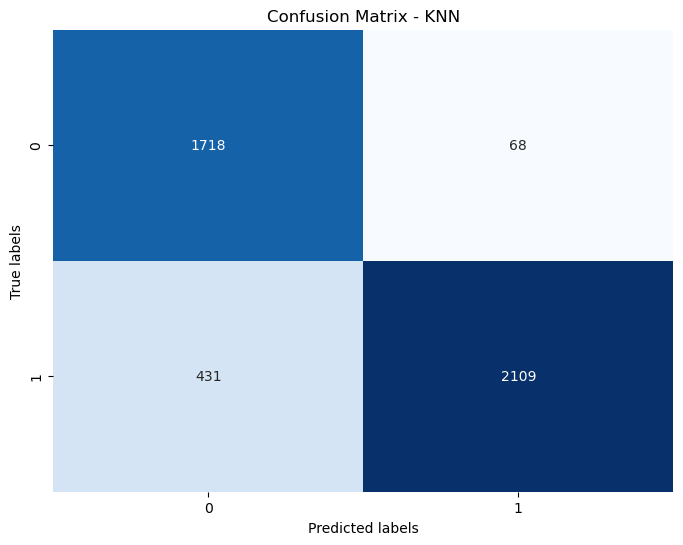

PCA dataset
Accuracy: 0.49158450984636515


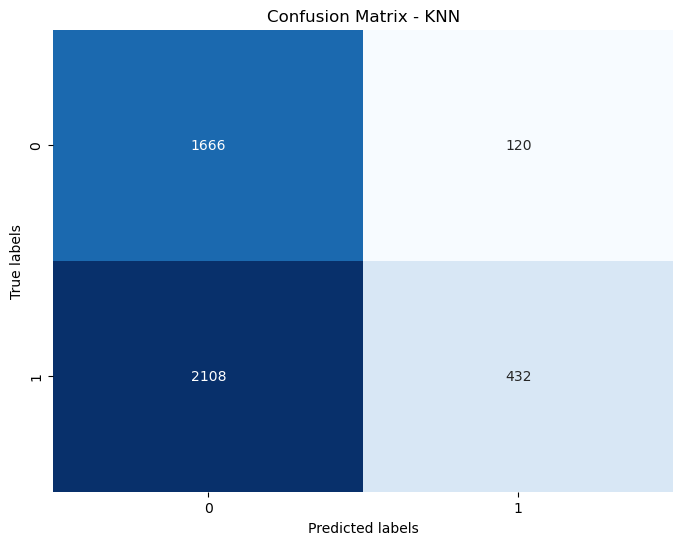

UMAP dataset
Accuracy: 0.90289463093167


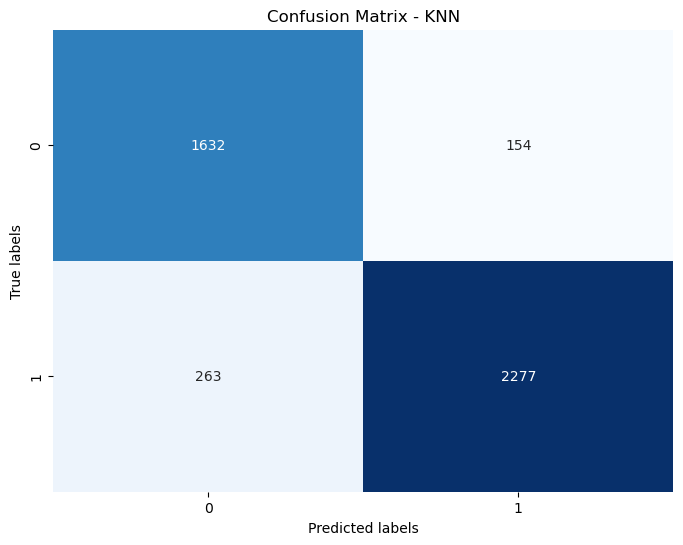

In [46]:
for x in dataset_dropseq.keys():
    print(x)
    kneighbors_dropseq = run_kneighbors(dataset_dropseq[x])
    filename = f"pickle/{tumor}/knn/dropseq_{x}"
    with open(filename, 'wb') as f:
        pickle.dump(kneighbors_dropseq, f)
    print(f"Accuracy: {kneighbors_dropseq['accuracy']}")
    plot_confusion_matrix(kneighbors_dropseq, kneighbors_dropseq['name'])

### Logistic regression classification

In [36]:
def run_log_regression(dataset):
    X, y, X_train, X_test, y_train, y_test, kfold = load_dataset(dataset)
    retval = {}
    retval['dataset'] = dataset
    retval['name'] = 'Logistic Regression'
    # Define the parameter grid
    param_grid = {
        'penalty': ['l1', 'l2', 'elasticnet', 'none'],
        'C': np.linspace(0.1, 1, 10),
        'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']}

    log_reg = LogisticRegression()

    random_search = RandomizedSearchCV(log_reg, param_distributions=param_grid, n_iter=50, scoring='accuracy',
                                        n_jobs=-1, cv=kfold, random_state=123)


    # Fit the model
    random_search.fit(X, y)

    # Print the best parameters
    retval['parameters'] = random_search.best_params_

    lr_optm = LogisticRegression(**random_search.best_params_)

    # Train the model
    lr_optm.fit(X_train, y_train)
    retval['model'] = lr_optm

    # Make predictions on the test set
    log_reg_predictions = lr_optm.predict(X_test)
    retval['predictions'] = log_reg_predictions

    # Calculate accuracy
    log_reg_accuracy = accuracy_score(y_test, log_reg_predictions)

    # Perform k-fold cross-validation
    cv_results = cross_val_score(lr_optm, X, y, cv=kfold, scoring='accuracy')
    retval['accuracy'] = cv_results.mean()

    # Create confusion matrix
    conf_matrix = confusion_matrix(y_test, log_reg_predictions)
    retval['confusion_matrix'] = conf_matrix

    #Calculate Precision
    prec = precision_score(y_test, log_reg_predictions)
    retval['precision'] = prec

    #Calculate Recall
    rec = recall_score(y_test, log_reg_predictions)
    retval['recall'] = rec
    
    #Calculate F1 score
    f1 = f1_score(y_test, log_reg_predictions)
    retval['f1'] = f1

    #Calculate AUC
    auc = roc_auc_score(y_test, log_reg_predictions)
    retval['auc'] = auc

    return retval

merged dataset


/Users/edoardoghirardo/miniconda/envs/edo/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/edoardoghirardo/miniconda/envs/edo/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/edoardoghirardo/miniconda/envs/edo/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/edoardoghirardo/miniconda/envs/edo/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/edoardoghirardo/miniconda/envs/edo/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did 

Accuracy: 1.0


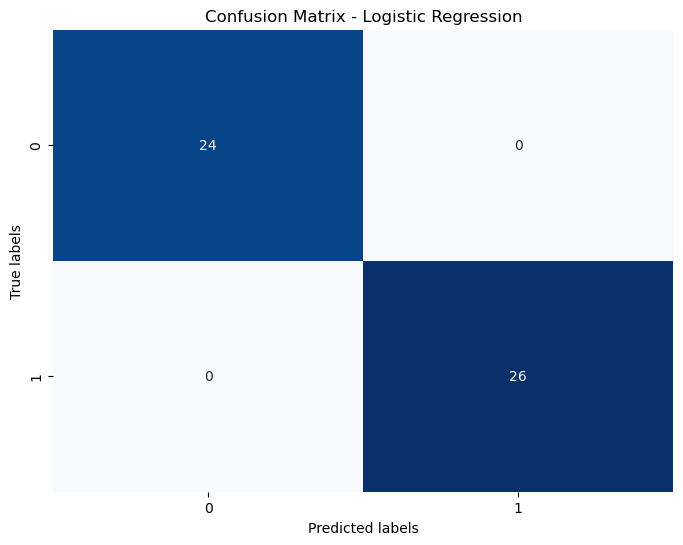

PCA dataset


/Users/edoardoghirardo/miniconda/envs/edo/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/edoardoghirardo/miniconda/envs/edo/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/edoardoghirardo/miniconda/envs/edo/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/edoardoghirardo/miniconda/envs/edo/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/edoardoghirardo/miniconda/envs/edo/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did 

Accuracy: 1.0


/Users/edoardoghirardo/miniconda/envs/edo/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/edoardoghirardo/miniconda/envs/edo/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/edoardoghirardo/miniconda/envs/edo/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/edoardoghirardo/miniconda/envs/edo/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/edoardoghirardo/miniconda/envs/edo/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did 

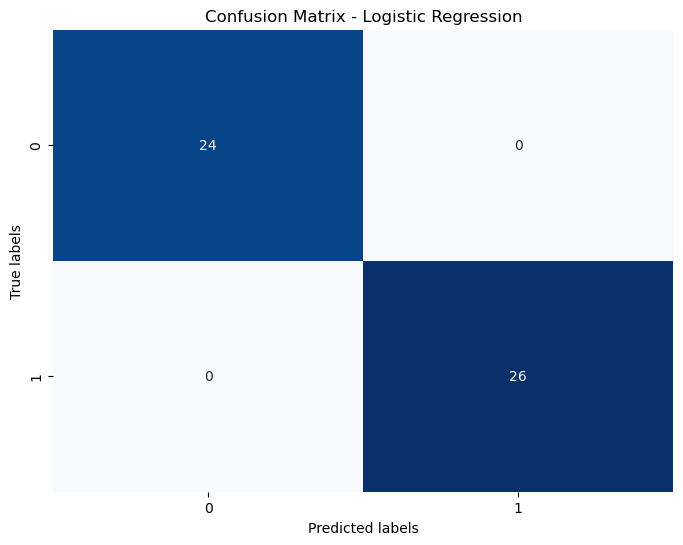

UMAP dataset


/Users/edoardoghirardo/miniconda/envs/edo/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/edoardoghirardo/miniconda/envs/edo/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/edoardoghirardo/miniconda/envs/edo/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/edoardoghirardo/miniconda/envs/edo/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/edoardoghirardo/miniconda/envs/edo/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did 

Accuracy: 0.984


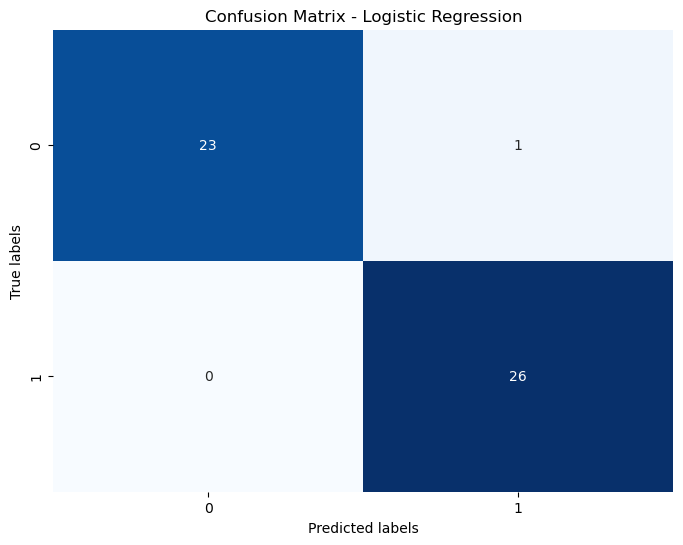

In [37]:
for x in dataset_smartseq.keys():
    print(x)
    log_regression_smartseq = run_log_regression(dataset_smartseq[x])
    filename = f"pickle/{tumor}/logreg/smartseq_{x}"
    with open(filename, 'wb') as f:
        pickle.dump(log_regression_smartseq, f)
    print(f"Accuracy: {log_regression_smartseq['accuracy']}")
    plot_confusion_matrix(log_regression_smartseq, log_regression_smartseq['name'])


merged dataset


/Users/edoardoghirardo/miniconda/envs/edo/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/edoardoghirardo/miniconda/envs/edo/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/edoardoghirardo/miniconda/envs/edo/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/edoardoghirardo/miniconda/envs/edo/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/edoardoghirardo/miniconda/envs/edo/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did 

Accuracy: 0.9802552224885689


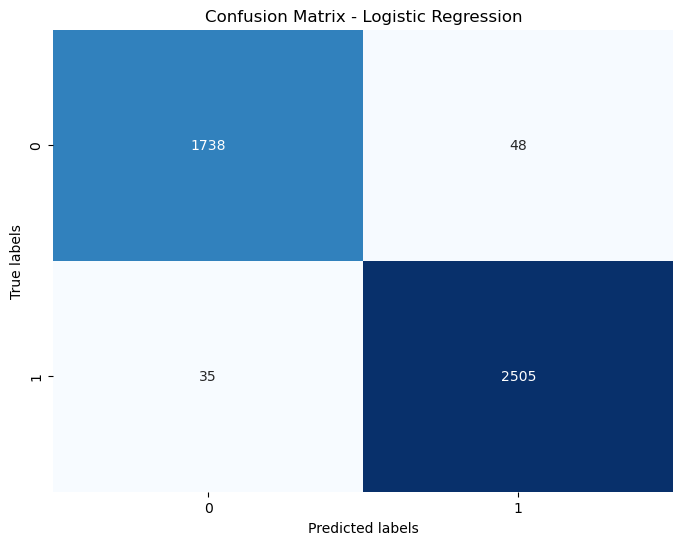

PCA dataset


/Users/edoardoghirardo/miniconda/envs/edo/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/edoardoghirardo/miniconda/envs/edo/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/edoardoghirardo/miniconda/envs/edo/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/edoardoghirardo/miniconda/envs/edo/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/edoardoghirardo/miniconda/envs/edo/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did 

Accuracy: 0.9906131229639843


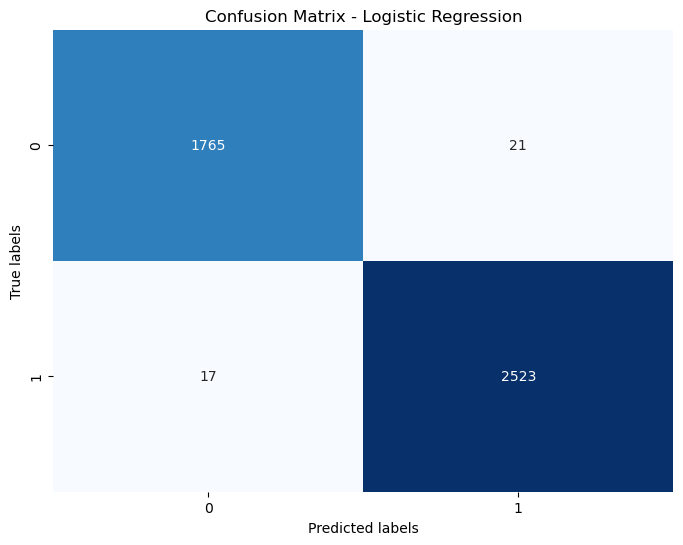

UMAP dataset


/Users/edoardoghirardo/miniconda/envs/edo/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/edoardoghirardo/miniconda/envs/edo/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/edoardoghirardo/miniconda/envs/edo/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/edoardoghirardo/miniconda/envs/edo/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/edoardoghirardo/miniconda/envs/edo/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did 

Accuracy: 0.8474519386743417


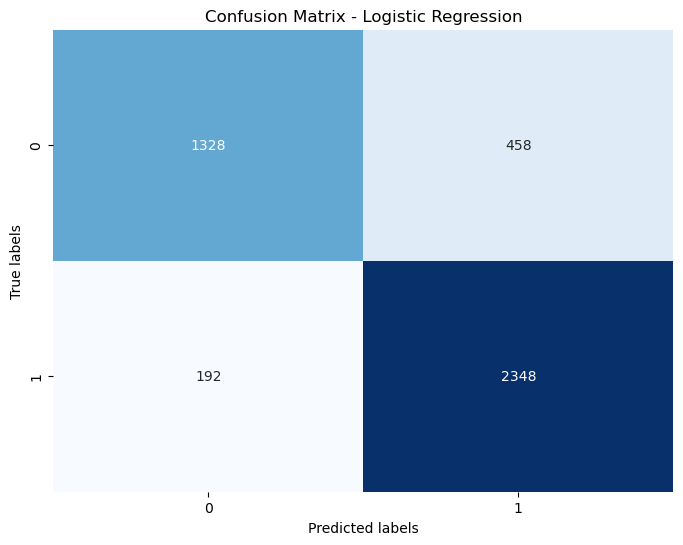

In [38]:
for x in dataset_dropseq.keys():
    print(x)
    log_regression_dropseq = run_log_regression(dataset_dropseq[x])
    filename = f"pickle/{tumor}/logreg/dropseq_{x}"
    with open(filename, 'wb') as f:
        pickle.dump(log_regression_dropseq, f)
    print(f"Accuracy: {log_regression_dropseq['accuracy']}")
    plot_confusion_matrix(log_regression_dropseq, log_regression_dropseq['name'])

### Random forest classification

In [55]:
def run_random_forest(dataset):
    X, y, X_train, X_test, y_train, y_test, kfold = load_dataset(dataset)
    retval = {}
    retval['dataset'] = dataset
    retval['name'] = 'Random Forest'

    # We start by estimating the most important hyperparameter: the number of trees

    param_range = np.arange(1, 100, 10)
    train_scores, test_scores = validation_curve(
        RandomForestClassifier(random_state=42),
        X_train, y_train,
        param_name='n_estimators',
        param_range=param_range,
        cv=5,
        scoring='accuracy'
    )

    # We proceed to do a grid search to find the optimal hyperparameters with cross-validation
    param_grid = {
        'max_depth': np.arange(1, 10, 1),
        'min_samples_split': np.arange(2, 10, 1),
        'min_samples_leaf': np.arange(1, 10, 1)
    }

    grid_search = GridSearchCV(RandomForestClassifier(n_estimators = 21, random_state=42), param_grid, cv=10, scoring='accuracy', n_jobs=-1)
    grid_search.fit(X_train, y_train)

    # Get the best hyperparameters
    retval['parameters']= grid_search.best_params_

    # Now we implement the best model
    rf_optm = RandomForestClassifier(n_estimators=21, random_state=42, **retval['parameters'])
    
    # Train the model
    rf_optm.fit(X_train, y_train)
    retval['model'] = rf_optm
    
    # Make predictions on the test set
    rf_predictions = rf_optm.predict(X_test)
    retval['predictions'] = rf_predictions


    # Calculate accuracy
    accuracy = accuracy_score(y_test,rf_predictions)

    # Perform k-fold cross-validation
    cv_results = cross_val_score(rf_optm, X, y, cv=kfold, scoring='accuracy')
    retval['accuracy'] = cv_results.mean()

    # Create confusion matrix
    conf_matrix = confusion_matrix(y_test, rf_predictions)
    retval['confusion_matrix'] = conf_matrix

    #Calculate Precision
    prec = precision_score(y_test, rf_predictions)
    retval['precision'] = prec

    #Calculate Recall
    rec = recall_score(y_test, rf_predictions)
    retval['recall'] = rec
    
    #Calculate F1 score
    f1 = f1_score(y_test, rf_predictions)
    retval['f1'] = f1

    #Calculate AUC
    auc = roc_auc_score(y_test, rf_predictions)
    retval['auc'] = auc

    return retval

merged dataset
Accuracy: 0.9879999999999999


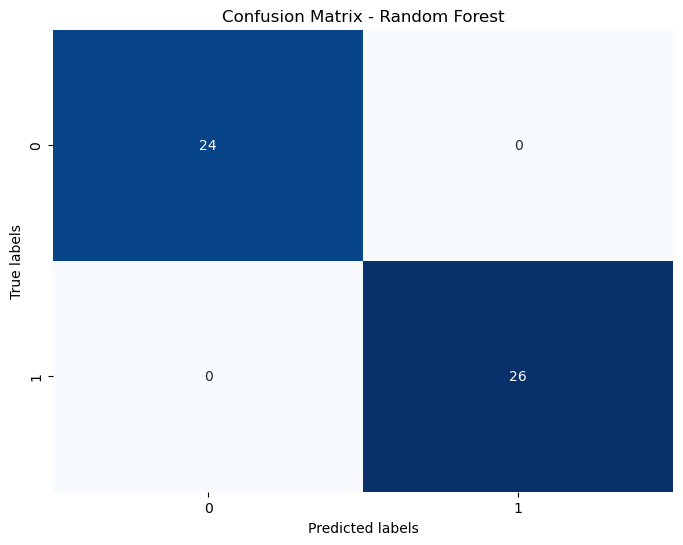

PCA dataset
Accuracy: 0.968


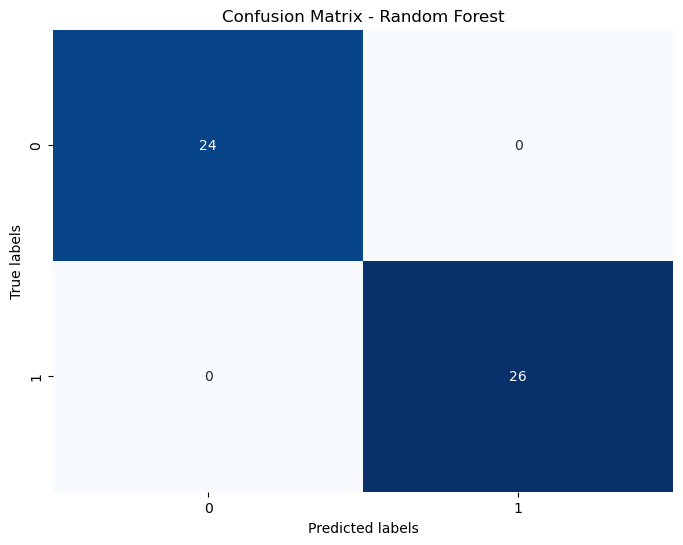

UMAP dataset
Accuracy: 0.9879999999999999


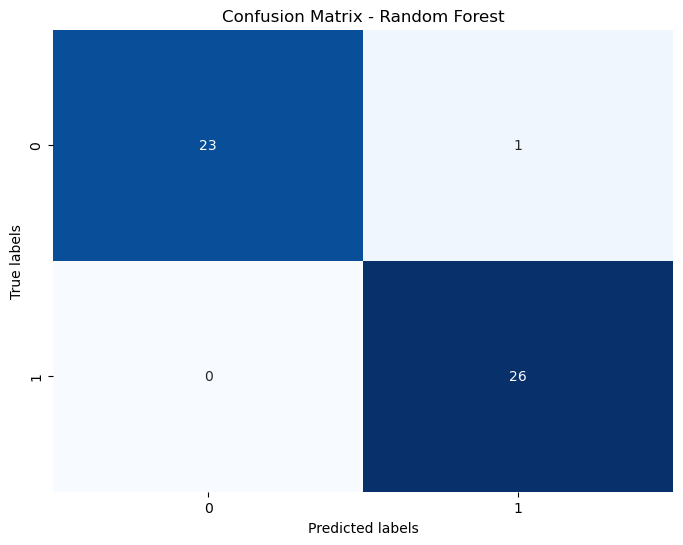

In [56]:
for x in dataset_smartseq.keys():
    print(x)
    rf_smartseq = run_random_forest(dataset_smartseq[x])
    filename = f"pickle/{tumor}/rf/smartseq_{x}"
    with open(filename, 'wb') as f:
        pickle.dump(rf_smartseq, f)
    print(f"Accuracy: {rf_smartseq['accuracy']}")
    plot_confusion_matrix(rf_smartseq, rf_smartseq['name'])


Fold 1 Evaluation Scores:
Accuracy: 0.98
Precision: 1.0
Recall: 0.9615384615384616
F1-score: 0.9803921568627451

Fold 2 Evaluation Scores:
Accuracy: 1.0
Precision: 1.0
Recall: 1.0
F1-score: 1.0

Fold 3 Evaluation Scores:
Accuracy: 0.98
Precision: 1.0
Recall: 0.9629629629629629
F1-score: 0.9811320754716981

Fold 4 Evaluation Scores:
Accuracy: 0.98
Precision: 1.0
Recall: 0.9583333333333334
F1-score: 0.9787234042553191

Fold 5 Evaluation Scores:
Accuracy: 1.0
Precision: 1.0
Recall: 1.0
F1-score: 1.0


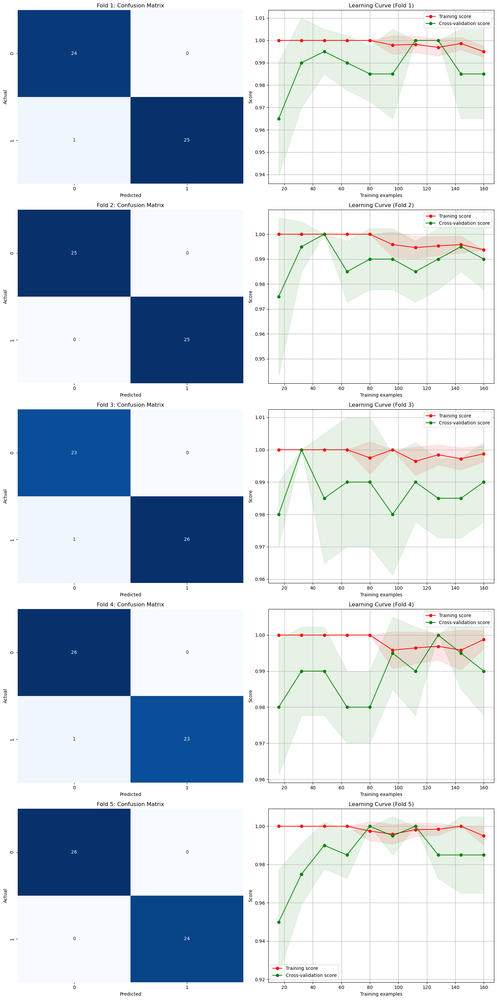


Mean Evaluation Scores Across Folds:
Mean Accuracy: 0.9879999999999999
Mean Precision: 1.0
Mean Recall: 0.9765669515669515
Mean F1-score: 0.9880495273179524


In [57]:
# Initialize lists to store evaluation scores
accuracy_scores = []
precision_scores = []
recall_scores = []
f1_scores = []

# Create subplots for confusion matrices and learning curves
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(15, 30))

X, y, X_train, X_test, y_train, y_test, kfold = load_dataset(dataset_smartseq['merged dataset'])

# Iterate over folds
for i, (train_index, test_index) in enumerate(kfold.split(X)):
    # Split data into training and testing sets
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Create a Random Forest Classifier model
    merged_randomforest_smartseq = run_random_forest(dataset_smartseq['merged dataset'])
    rf = RandomForestClassifier(n_estimators=21, random_state=42, **merged_randomforest_smartseq['parameters'])

    # Fit the model to the training data
    rf.fit(X_train, y_train)

    # Predict on the testing data
    y_pred = rf.predict(X_test)
    
    # Calculate evaluation scores
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)

    # Append scores to lists
    accuracy_scores.append(accuracy)
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

    # Print evaluation scores for each fold
    print(f"\nFold {i+1} Evaluation Scores:")
    print("Accuracy:", accuracy)
    print("Precision:", precision)
    print("Recall:", recall)
    print("F1-score:", f1)

    # Plot confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', cbar=False, ax=axes[i, 0])
    axes[i, 0].set_xlabel('Predicted')
    axes[i, 0].set_ylabel('Actual')
    axes[i, 0].set_title(f'Fold {i+1}: Confusion Matrix')

    # Plot learning curve
    train_sizes, train_scores, test_scores = learning_curve(rf, X_train, y_train, cv=kfold, n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10), scoring='accuracy')
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    axes[i, 1].fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.1, color="r")
    axes[i, 1].fill_between(train_sizes, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, alpha=0.1, color="g")
    axes[i, 1].plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
    axes[i, 1].plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-validation score")
    axes[i, 1].set_xlabel("Training examples")
    axes[i, 1].set_ylabel("Score")
    axes[i, 1].set_title(f"Learning Curve (Fold {i+1})")
    axes[i, 1].legend(loc="best")
    axes[i, 1].grid()

plt.tight_layout()
plt.show()

# Print mean evaluation scores across all folds
print("\nMean Evaluation Scores Across Folds:")
print("Mean Accuracy:", np.mean(accuracy_scores))
print("Mean Precision:", np.mean(precision_scores))
print("Mean Recall:", np.mean(recall_scores))
print("Mean F1-score:", np.mean(f1_scores))


merged dataset
Accuracy: 0.9337838315976258


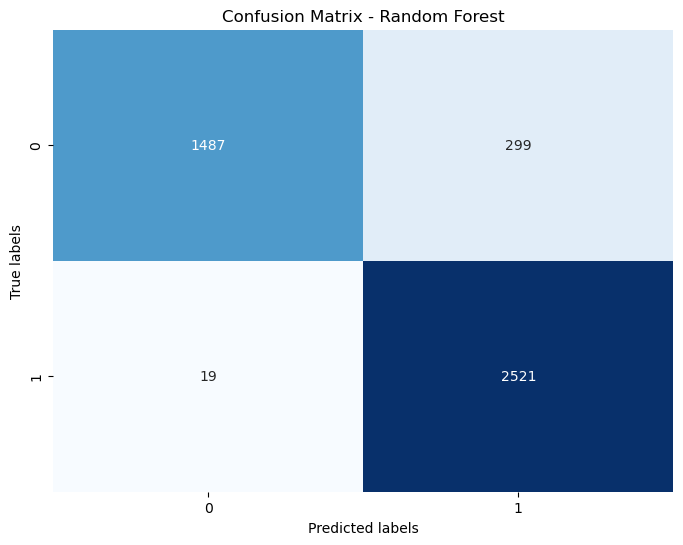

PCA dataset
Accuracy: 0.8351055561345702


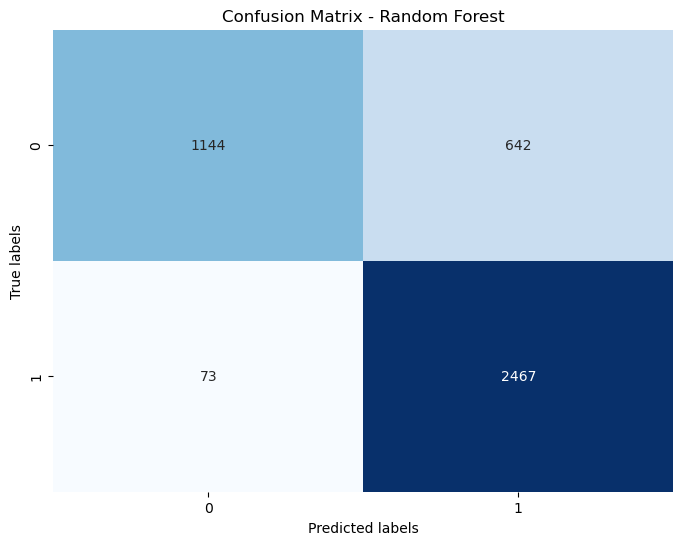

UMAP dataset
Accuracy: 0.8956815384327591


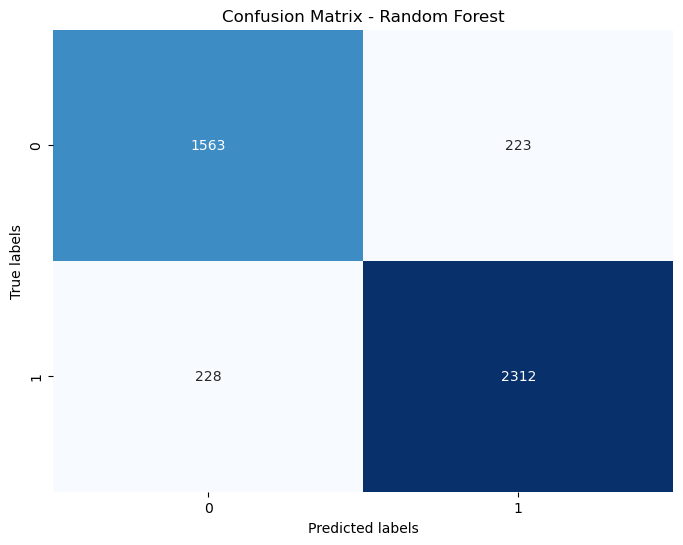

In [58]:
for x in dataset_dropseq.keys():
    print(x)
    rf_dropseq = run_random_forest(dataset_dropseq[x])
    filename = f"pickle/{tumor}/rf/dropseq_{x}"
    with open(filename, 'wb') as f:
        pickle.dump(rf_dropseq, f)
    print(f"Accuracy: {rf_dropseq['accuracy']}")
    plot_confusion_matrix(rf_dropseq, rf_dropseq['name'])

### Support Vector Machine

In [48]:
def run_svm(dataset):
    X, y, X_train, X_test, y_train, y_test, kfold = load_dataset(dataset)
    retval = {}
    retval['dataset'] = dataset
    retval['name'] = 'SVM'

    # Define the parameter grid
    param_grid = {'C': [0.01, 0.1, 1, 10, 100, 1000], 
                'gamma': [1, 0.1, 0.01, 0.001, 0.0001], 
                'kernel': ['rbf', 'linear', 'poly', 'sigmoid']}
    
    svc_cl = SVC()

    # Initialize random search with the SVC classifier and parameter grid
    random_search = RandomizedSearchCV(estimator = svc_cl, param_distributions=param_grid, n_iter=20, cv=kfold, verbose=2, n_jobs=-1, refit=True)

    # Perform grid search with cross-validation
    random_search.fit(X_train, y_train)

    # Print the best parameters found
    #print("Best parameters:", grid.best_params_)
    retval['parameters'] = random_search.best_params_

    #Now we implement the best model
    svm_optm = SVC(**random_search.best_params_)

    #train the model
    svm_optm.fit(X_train, y_train)
    retval['model'] = svm_optm

    # Make predictions on the test set
    svm_predictions = svm_optm.predict(X_test)
    retval['predictions'] = svm_predictions

    #Calculate accuracy
    accuracy = accuracy_score(y_test, svm_predictions)

    # Perform k-fold cross-validation
    cv_results = cross_val_score(svm_optm, X, y, cv=kfold, scoring='accuracy')
    retval['accuracy'] = cv_results.mean()

    # Create confusion matrix
    conf_matrix = confusion_matrix(y_test, svm_predictions)
    retval['confusion_matrix'] = conf_matrix

    #Calculate Precision
    prec = precision_score(y_test, svm_predictions)
    retval['precision'] = prec

    #Calculate Recall
    rec = recall_score(y_test, svm_predictions)
    retval['recall'] = rec
    
    #Calculate F1 score
    f1 = f1_score(y_test, svm_predictions)
    retval['f1'] = f1

    #Calculate AUC
    auc = roc_auc_score(y_test, svm_predictions)
    retval['auc'] = auc

    return retval

In [49]:
def plot_svm_feature_importance(model_dict):
    dataset = model_dict['dataset']
    X, y, X_train, X_test, y_train, y_test, kfold = load_dataset(dataset)
    feature_names = X_train.columns.tolist()

    # Check if the classifier is a linear SVM and has coefficients
    if hasattr(model_dict['model'], 'coef_'):
        # Get feature importances (coefficients)
        feature_importance = model_dict['model'].coef_[0]
        
        # Sort feature importances in descending order
        sorted_indices = np.argsort(np.abs(feature_importance))[::-1]
        sorted_feature_importance = feature_importance[sorted_indices]
        
        # Plot top 50 feature importances
        top_n = 50
        plt.figure(figsize=(12, 8))
        plt.bar(range(top_n), sorted_feature_importance[:top_n], align='center')
        plt.xticks(range(top_n), [feature_names[i] for i in sorted_indices[:top_n]], rotation=90)
        plt.xlabel('Feature')
        plt.ylabel('Coefficient Magnitude')
        plt.title('Top 50 Feature Importance (Coefficients)')
        plt.tight_layout()
        plt.show()

In [50]:
def plot_separating_hyperplane(model_dict):
    dataset = model_dict['dataset']
    X, y, X_train, X_test, y_train, y_test, kfold = load_dataset(dataset)

    # Reduce dimensionality of data to 3 dimensions using UMAP
    umap_model = umap.UMAP(n_components=3)
    X_train_3d_umap = umap_model.fit_transform(X_train)

    # Train the SVM classifier on the reduced-dimensional data
    best_svm_3d = SVC(C=0.01, gamma=1, kernel='linear', probability=True)
    best_svm_3d.fit(X_train_3d_umap, y_train)

    # Get the coefficients and intercept of the linear separator
    coef = best_svm_3d.coef_
    intercept = best_svm_3d.intercept_

    # Define ranges for creating a smaller meshgrid
    x_min, x_max = X_train_3d_umap[:, 0].min() - 1, X_train_3d_umap[:, 0].max() + 1
    y_min, y_max = X_train_3d_umap[:, 1].min() - 1, X_train_3d_umap[:, 1].max() + 1
    z_min, z_max = X_train_3d_umap[:, 2].min() - 1, X_train_3d_umap[:, 2].max() + 1

    # Create a smaller meshgrid
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 50),
                        np.linspace(y_min, y_max, 50))

    # Calculate corresponding z values for the linear separator
    zz = (-coef[0, 0] * xx - coef[0, 1] * yy - intercept) / coef[0, 2]

    # Create a 3D scatter plot for the data points
    fig = px.scatter_3d(x=X_train_3d_umap[:, 0], y=X_train_3d_umap[:, 1], z=X_train_3d_umap[:, 2], color=y_train)

    # Add decision boundary to the plot
    fig.add_trace(go.Surface(x=xx, y=yy, z=zz, showscale=False, opacity=0.5, colorscale='Blues'))

    # Set axis labels
    fig.update_layout(scene=dict(xaxis_title='UMAP Component 1',
                                yaxis_title='UMAP Component 2',
                                zaxis_title='UMAP Component 3'),
                    title='Decision Boundary and Linear Separator in 3D')

    # Show the plot
    fig.show()


merged dataset
Fitting 5 folds for each of 20 candidates, totalling 100 fits


[CV] END ........................C=100, gamma=1, kernel=poly; total time=   0.0s
[CV] END ........................C=100, gamma=1, kernel=poly; total time=   0.0s
[CV] END ........................C=100, gamma=1, kernel=poly; total time=   0.0s
[CV] END ........................C=100, gamma=1, kernel=poly; total time=   0.0s
[CV] END ........................C=100, gamma=1, kernel=poly; total time=   0.0s
[CV] END .................C=10, gamma=0.0001, kernel=sigmoid; total time=   0.1s
[CV] END .................C=10, gamma=0.0001, kernel=sigmoid; total time=   0.1s
[CV] END .................C=10, gamma=0.0001, kernel=sigmoid; total time=   0.1s
[CV] END ...................C=10, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ...................C=10, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ...................C=10, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END .................C=10, gamma=0.0001, kernel=sigmoid; total time=   0.0s
[CV] END ...................

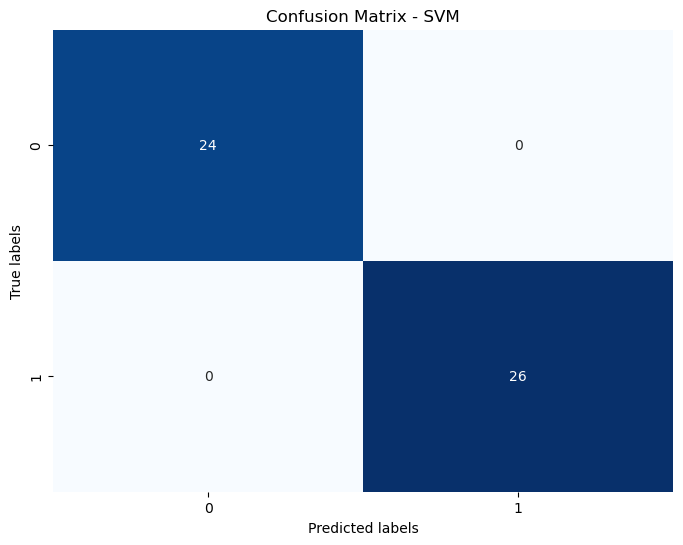

PCA dataset
Fitting 5 folds for each of 20 candidates, totalling 100 fits
[CV] END ...................C=0.01, gamma=0.001, kernel=poly; total time=   0.0s
[CV] END ...................C=0.01, gamma=0.001, kernel=poly; total time=   0.0s
[CV] END ...................C=0.01, gamma=0.001, kernel=poly; total time=   0.0s
[CV] END ...................C=0.01, gamma=0.001, kernel=poly; total time=   0.0s
[CV] END ..................C=100, gamma=0.01, kernel=sigmoid; total time=   0.0s
[CV] END ...................C=0.01, gamma=0.001, kernel=poly; total time=   0.0s
[CV] END ..................C=100, gamma=0.01, kernel=sigmoid; total time=   0.0s
[CV] END ..................C=100, gamma=0.01, kernel=sigmoid; total time=   0.0s
[CV] END ..................C=100, gamma=0.01, kernel=sigmoid; total time=   0.0s
[CV] END ..................C=100, gamma=0.01, kernel=sigmoid; total time=   0.0s
[CV] END ..................C=10, gamma=0.0001, kernel=linear; total time=   0.0s
[CV] END ..................C=10, ga

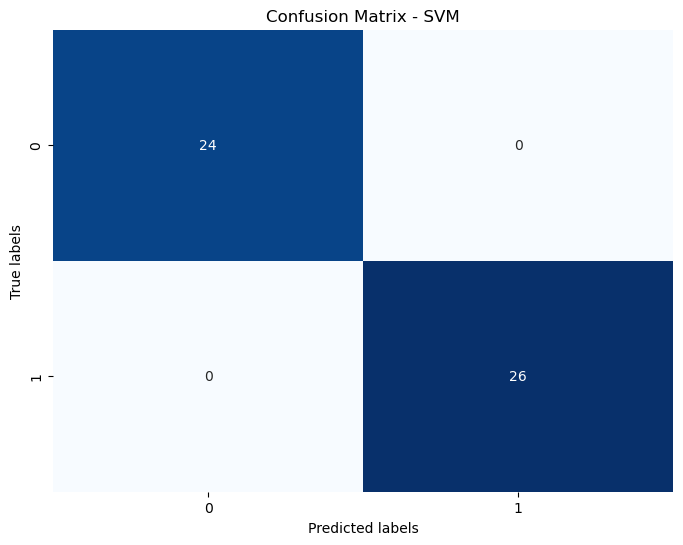

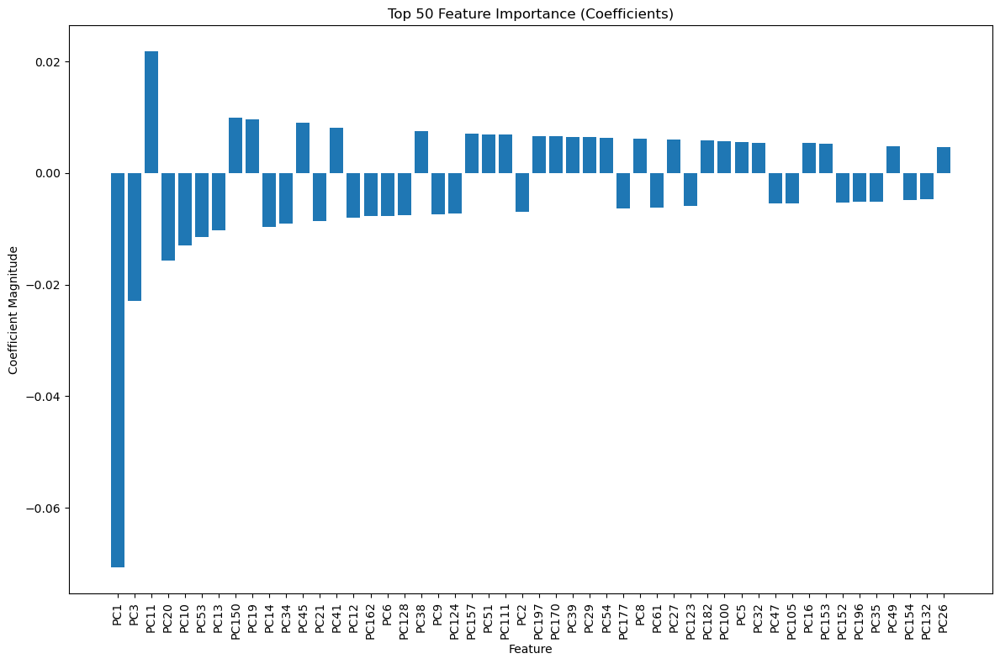

UMAP dataset
Fitting 5 folds for each of 20 candidates, totalling 100 fits
[CV] END .....................C=10, gamma=0.1, kernel=linear; total time=   0.0s
[CV] END .....................C=10, gamma=0.1, kernel=linear; total time=   0.0s
[CV] END .....................C=10, gamma=0.1, kernel=linear; total time=   0.0s
[CV] END .....................C=10, gamma=0.1, kernel=linear; total time=   0.0s
[CV] END .....................C=10, gamma=0.1, kernel=linear; total time=   0.0s
[CV] END ................C=0.01, gamma=0.001, kernel=sigmoid; total time=   0.0s
[CV] END ................C=0.01, gamma=0.001, kernel=sigmoid; total time=   0.0s
[CV] END ................C=0.01, gamma=0.001, kernel=sigmoid; total time=   0.0s
[CV] END ................C=0.01, gamma=0.001, kernel=sigmoid; total time=   0.0s
[CV] END ................C=0.01, gamma=0.001, kernel=sigmoid; total time=   0.0s
[CV] END .........................C=100, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................

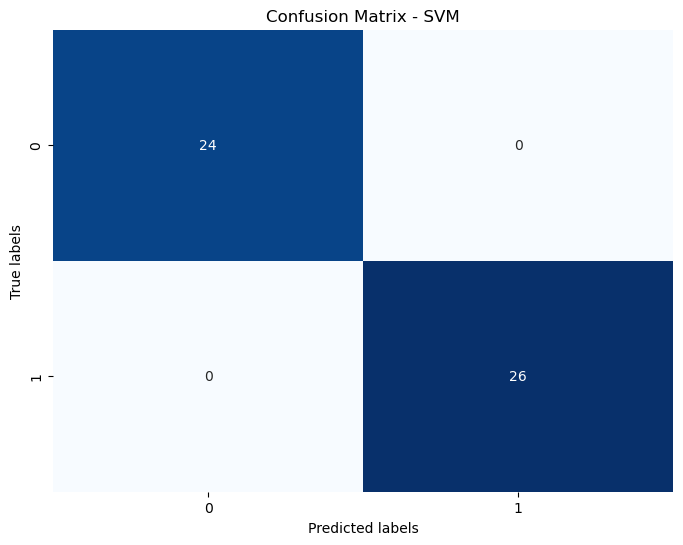

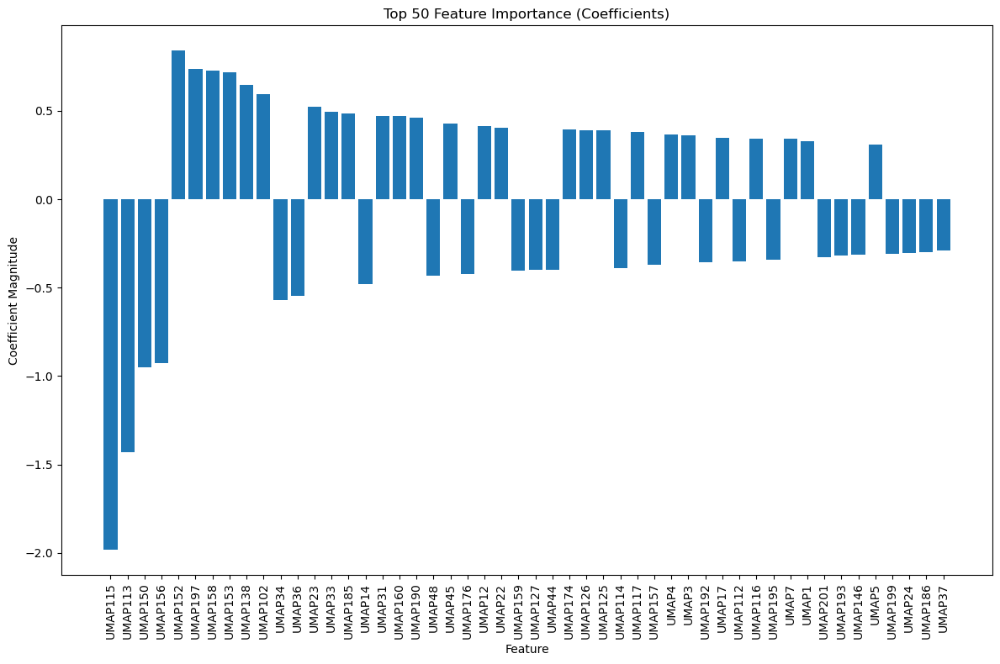

In [51]:
for x in dataset_smartseq.keys():
    print(x)
    svm_smartseq = run_svm(dataset_smartseq[x])
    filename = f"pickle/{tumor}/svm/smartseq_{x}"
    with open(filename, 'wb') as f:
        pickle.dump(svm_smartseq, f)
    print(f"Accuracy: {svm_smartseq['accuracy']}")
    plot_confusion_matrix(svm_smartseq, svm_smartseq['name'])
    plot_svm_feature_importance(svm_smartseq)
    plot_separating_hyperplane(svm_smartseq)

merged dataset
Fitting 5 folds for each of 20 candidates, totalling 100 fits
[CV] END ........................C=0.1, gamma=1, kernel=poly; total time= 1.8min


/Users/edoardoghirardo/miniconda/envs/edo/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


[CV] END ........................C=0.1, gamma=1, kernel=poly; total time= 1.8min


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


[CV] END ........................C=0.1, gamma=1, kernel=poly; total time= 1.8min
[CV] END ........................C=0.1, gamma=1, kernel=poly; total time= 1.8min
[CV] END ........................C=0.1, gamma=1, kernel=poly; total time= 1.8min


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


[CV] END ....................C=100, gamma=0.001, kernel=poly; total time= 1.9min
[CV] END ....................C=100, gamma=0.001, kernel=poly; total time= 1.9min
[CV] END ....................C=100, gamma=0.001, kernel=poly; total time= 1.9min
[CV] END .................C=100, gamma=0.0001, kernel=linear; total time=  44.7s
[CV] END .................C=100, gamma=0.0001, kernel=linear; total time=  45.3s
[CV] END .................C=100, gamma=0.0001, kernel=linear; total time=  47.5s
[CV] END .................C=100, gamma=0.0001, kernel=linear; total time=  47.9s
[CV] END .................C=100, gamma=0.0001, kernel=linear; total time=  47.7s
[CV] END ...................C=1, gamma=0.001, kernel=sigmoid; total time= 1.4min


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


[CV] END ....................C=100, gamma=0.001, kernel=poly; total time= 1.8min
[CV] END ....................C=100, gamma=0.001, kernel=poly; total time= 1.8min
[CV] END ...................C=1, gamma=0.001, kernel=sigmoid; total time= 1.3min
[CV] END ...................C=1, gamma=0.001, kernel=sigmoid; total time= 1.3min
[CV] END ...................C=1, gamma=0.001, kernel=sigmoid; total time= 1.4min
[CV] END ...................C=1, gamma=0.001, kernel=sigmoid; total time= 1.4min
[CV] END ..................C=1000, gamma=0.0001, kernel=poly; total time= 5.0min


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


[CV] END ..................C=1000, gamma=0.0001, kernel=poly; total time= 5.1min
[CV] END ..................C=1000, gamma=0.0001, kernel=poly; total time= 5.1min
[CV] END ................C=0.01, gamma=0.0001, kernel=linear; total time= 2.6min
[CV] END ................C=0.01, gamma=0.0001, kernel=linear; total time=  55.2s
[CV] END ................C=0.01, gamma=0.0001, kernel=linear; total time=11.6min
[CV] END ................C=0.01, gamma=0.0001, kernel=linear; total time= 1.6min
[CV] END ................C=0.01, gamma=0.0001, kernel=linear; total time= 1.7min
[CV] END ...................C=1000, gamma=0.1, kernel=linear; total time= 4.1min
[CV] END ..................C=1000, gamma=0.0001, kernel=poly; total time=22.6min
[CV] END ..................C=1000, gamma=0.0001, kernel=poly; total time=22.6min
[CV] END ...................C=1000, gamma=0.1, kernel=linear; total time= 5.3min
[CV] END ...................C=1000, gamma=0.1, kernel=linear; total time= 5.3min
[CV] END ...................

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


[CV] END ....................C=0.01, gamma=0.01, kernel=poly; total time= 2.7min
[CV] END ......................C=1, gamma=0.001, kernel=poly; total time= 4.8min
[CV] END ....................C=0.01, gamma=0.01, kernel=poly; total time= 2.6min
[CV] END ..........................C=1, gamma=1, kernel=poly; total time= 1.6min
[CV] END ..........................C=1, gamma=1, kernel=poly; total time= 1.6min
[CV] END ..........................C=1, gamma=1, kernel=poly; total time= 1.6min
[CV] END ..........................C=1, gamma=1, kernel=poly; total time= 1.6min
[CV] END ..........................C=1, gamma=1, kernel=poly; total time= 1.6min
[CV] END ....................C=0.01, gamma=0.01, kernel=poly; total time= 2.7min
[CV] END .......................C=1, gamma=0.01, kernel=poly; total time= 1.6min
[CV] END .......................C=1, gamma=0.01, kernel=poly; total time= 1.7min
[CV] END .......................C=1, gamma=0.01, kernel=poly; total time= 1.6min
[CV] END ...................

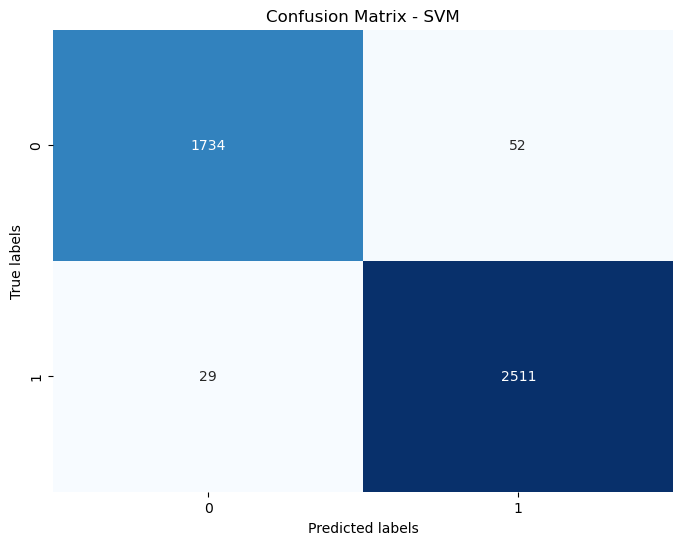

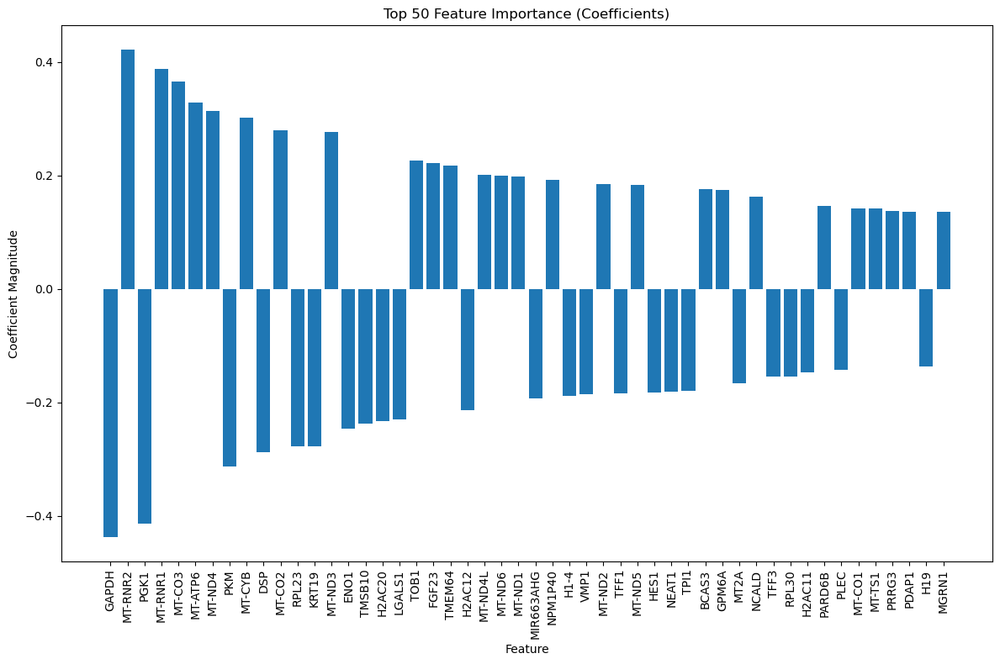

PCA dataset
Fitting 5 folds for each of 20 candidates, totalling 100 fits
[CV] END ....................C=100, gamma=0.0001, kernel=rbf; total time= 1.5min
[CV] END ....................C=100, gamma=0.0001, kernel=rbf; total time= 1.5min
[CV] END ....................C=100, gamma=0.0001, kernel=rbf; total time= 1.5min
[CV] END ....................C=100, gamma=0.0001, kernel=rbf; total time= 1.5min
[CV] END ....................C=100, gamma=0.0001, kernel=rbf; total time= 1.5min
[CV] END ......................C=0.1, gamma=1, kernel=linear; total time=  57.7s
[CV] END ......................C=0.1, gamma=1, kernel=linear; total time=  59.1s
[CV] END ......................C=0.1, gamma=1, kernel=linear; total time=  59.5s
[CV] END ......................C=0.1, gamma=1, kernel=linear; total time= 1.0min
[CV] END ......................C=0.1, gamma=1, kernel=linear; total time= 1.0min
[CV] END ...................C=100, gamma=0.0001, kernel=poly; total time=15.1min
[CV] END ...................C=100, 

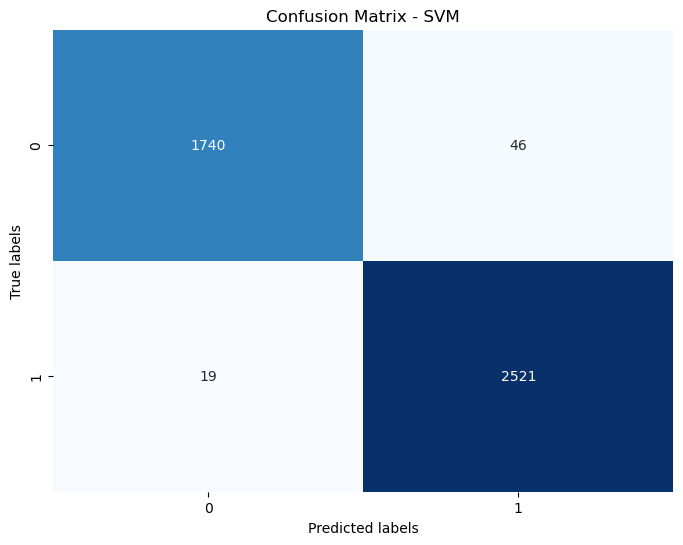

UMAP dataset
Fitting 5 folds for each of 20 candidates, totalling 100 fits
[CV] END ....................C=0.1, gamma=0.001, kernel=poly; total time= 3.4min
[CV] END ....................C=0.1, gamma=0.001, kernel=poly; total time= 3.5min
[CV] END ....................C=0.1, gamma=0.001, kernel=poly; total time= 3.5min
[CV] END ....................C=0.1, gamma=0.001, kernel=poly; total time= 3.5min
[CV] END ....................C=0.1, gamma=0.001, kernel=poly; total time= 3.5min
[CV] END ...................C=1, gamma=0.001, kernel=sigmoid; total time= 5.7min
[CV] END ...................C=1, gamma=0.001, kernel=sigmoid; total time= 5.7min
[CV] END ...................C=1, gamma=0.001, kernel=sigmoid; total time= 5.8min
[CV] END ...................C=1, gamma=0.001, kernel=sigmoid; total time= 5.8min
[CV] END ...................C=1, gamma=0.001, kernel=sigmoid; total time= 5.8min
[CV] END ..................C=0.01, gamma=0.1, kernel=sigmoid; total time= 5.8min
[CV] END ..................C=0.01,

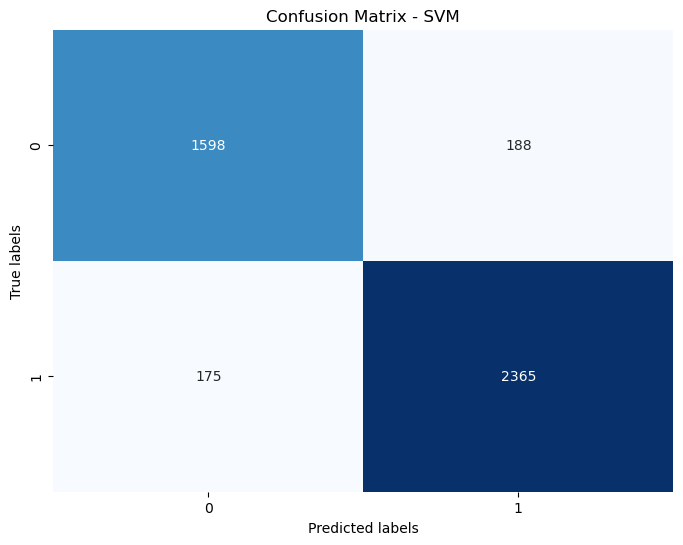

In [52]:
for x in dataset_dropseq.keys():
    print(x)
    svm_dropseq = run_svm(dataset_dropseq[x])
    filename = f"pickle/{tumor}/svm/dropseq_{x}"
    with open(filename, 'wb') as f:
        pickle.dump(svm_dropseq, f)
    print(f"Accuracy: {svm_dropseq['accuracy']}")
    plot_confusion_matrix(svm_dropseq, svm_dropseq['name'])
    plot_svm_feature_importance(svm_dropseq)
    plot_separating_hyperplane(svm_dropseq)

### Neural network

In [33]:
def run_nn(dataset, epochs):
    X, y, X_train, X_test, y_train, y_test, kfold = load_dataset(dataset)
    retval = {}
    retval['dataset'] = dataset
    retval['name'] = 'NN'
    nn_model = MLPClassifier(solver='adam', alpha=1e-5, hidden_layer_sizes=(128, 128), random_state=1, max_iter=epochs, verbose=True)

    nn_model.fit(X_train, y_train)

    retval['model'] = nn_model
    
    #Make predictions on the test set
    nn_predictions = nn_model.predict(X_test)
    retval['predictions'] = nn_predictions

    # Create confusion matrix
    conf_matrix = confusion_matrix(y_test, nn_predictions)
    retval['confusion_matrix'] = conf_matrix

    # Calculate accuracy
    accuracy = nn_model.score(X_test, y_test)
    retval['accuracy'] = accuracy

    #Calculate Precision
    prec = precision_score(y_test, nn_predictions)
    retval['precision'] = prec

    #Calculate Recall
    rec = recall_score(y_test, nn_predictions)
    retval['recall'] = rec
    
    #Calculate F1 score
    f1 = f1_score(y_test, nn_predictions)
    retval['f1'] = f1

    #Calculate AUC
    auc = roc_auc_score(y_test, nn_predictions)
    retval['auc'] = auc
    
    return retval

merged dataset
Iteration 1, loss = 18.13937869
Iteration 2, loss = 15.85921687
Iteration 3, loss = 4.03637577
Iteration 4, loss = 0.72088246
Iteration 5, loss = 0.72088247
Iteration 6, loss = 0.90110078
Iteration 7, loss = 0.90147948
Iteration 8, loss = 0.54067104
Iteration 9, loss = 0.36044599
Iteration 10, loss = 0.00000947
Iteration 11, loss = 0.00000948
Iteration 12, loss = 0.00000949
Iteration 13, loss = 0.00000950
Iteration 14, loss = 0.00000951
Iteration 15, loss = 0.00000952
Iteration 16, loss = 0.00000953
Iteration 17, loss = 0.00000954
Iteration 18, loss = 0.00000955
Iteration 19, loss = 0.00000955
Iteration 20, loss = 0.00000956
Iteration 21, loss = 0.00000956
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Accuracy: 1.0


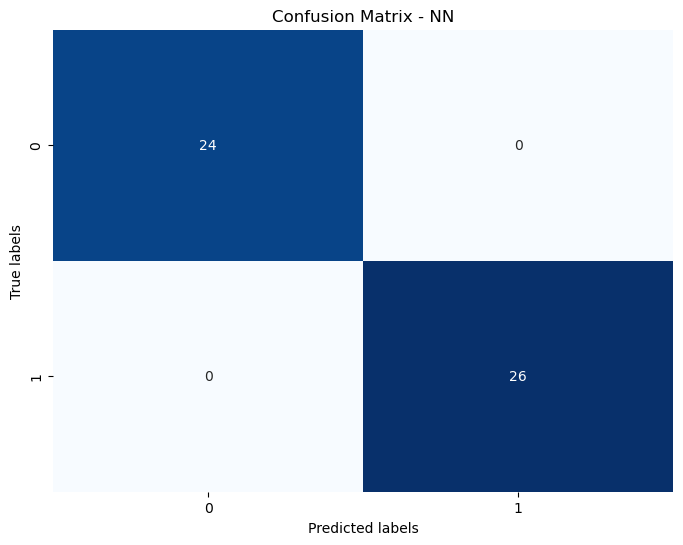

PCA dataset
Iteration 1, loss = 0.94490378
Iteration 2, loss = 0.57176189
Iteration 3, loss = 0.36542998
Iteration 4, loss = 0.22935198
Iteration 5, loss = 0.13746347
Iteration 6, loss = 0.08174432
Iteration 7, loss = 0.05060108
Iteration 8, loss = 0.03347063
Iteration 9, loss = 0.02359598
Iteration 10, loss = 0.01746748
Iteration 11, loss = 0.01337015
Iteration 12, loss = 0.01048420
Iteration 13, loss = 0.00837344
Iteration 14, loss = 0.00677978
Iteration 15, loss = 0.00556297
Iteration 16, loss = 0.00462259
Iteration 17, loss = 0.00388400
Iteration 18, loss = 0.00330186
Iteration 19, loss = 0.00284054
Iteration 20, loss = 0.00246653
Iteration 21, loss = 0.00216000
Iteration 22, loss = 0.00190700
Iteration 23, loss = 0.00169702
Iteration 24, loss = 0.00152205
Iteration 25, loss = 0.00137527
Iteration 26, loss = 0.00125076
Iteration 27, loss = 0.00114454
Iteration 28, loss = 0.00105334
Iteration 29, loss = 0.00097463
Iteration 30, loss = 0.00090624
Iteration 31, loss = 0.00084661
Itera

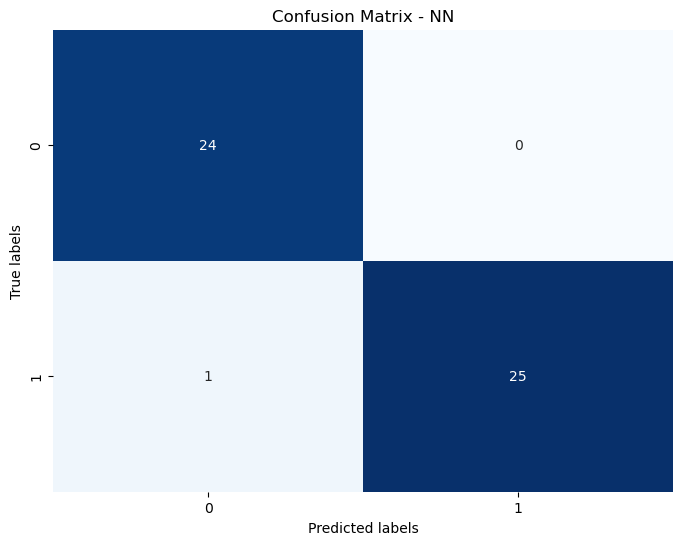

UMAP dataset
Iteration 1, loss = 0.94664223
Iteration 2, loss = 2.20105215
Iteration 3, loss = 1.56803241
Iteration 4, loss = 0.69924029
Iteration 5, loss = 1.17609806
Iteration 6, loss = 1.23530729
Iteration 7, loss = 0.88654405
Iteration 8, loss = 0.69169485
Iteration 9, loss = 0.84742079
Iteration 10, loss = 0.87540518
Iteration 11, loss = 0.75098242
Iteration 12, loss = 0.68123906
Iteration 13, loss = 0.75097383
Iteration 14, loss = 0.79012581
Iteration 15, loss = 0.72485747
Iteration 16, loss = 0.66466886
Iteration 17, loss = 0.70278735
Iteration 18, loss = 0.73623895
Iteration 19, loss = 0.70073727
Iteration 20, loss = 0.66021543
Iteration 21, loss = 0.67494035
Iteration 22, loss = 0.69943815
Iteration 23, loss = 0.68187110
Iteration 24, loss = 0.65198788
Iteration 25, loss = 0.65769137
Iteration 26, loss = 0.67555205
Iteration 27, loss = 0.66586101
Iteration 28, loss = 0.64406076
Iteration 29, loss = 0.64514763
Iteration 30, loss = 0.65723229
Iteration 31, loss = 0.65041530
Iter

/Users/edoardoghirardo/miniconda/envs/edo/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.



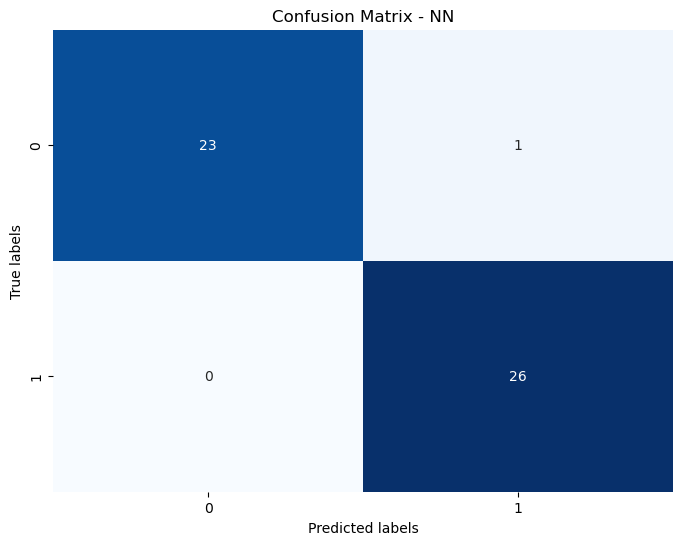

In [34]:
n_epochs = 100

for x in dataset_smartseq.keys():
    print(x)
    nn_smartseq = run_nn(dataset_smartseq[x], n_epochs)
    filename = f"pickle/{tumor}/nn/smartseq_{x}"
    with open(filename, 'wb') as f:
        pickle.dump(nn_smartseq, f)
    print(f"Accuracy: {nn_smartseq['accuracy']}")
    plot_confusion_matrix(nn_smartseq, nn_smartseq['name'])

merged dataset
Iteration 1, loss = 0.14272551
Iteration 2, loss = 0.03390303
Iteration 3, loss = 0.01577823
Iteration 4, loss = 0.00599996
Iteration 5, loss = 0.00232825
Iteration 6, loss = 0.00091185
Iteration 7, loss = 0.00037606
Iteration 8, loss = 0.00021977
Iteration 9, loss = 0.00015014
Iteration 10, loss = 0.00011433
Iteration 11, loss = 0.00009125
Iteration 12, loss = 0.00007520
Iteration 13, loss = 0.00006393
Iteration 14, loss = 0.00005525
Iteration 15, loss = 0.00004859
Iteration 16, loss = 0.00004330
Iteration 17, loss = 0.00003914
Iteration 18, loss = 0.00003567
Iteration 19, loss = 0.00003290
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Accuracy: 0.978502080443828


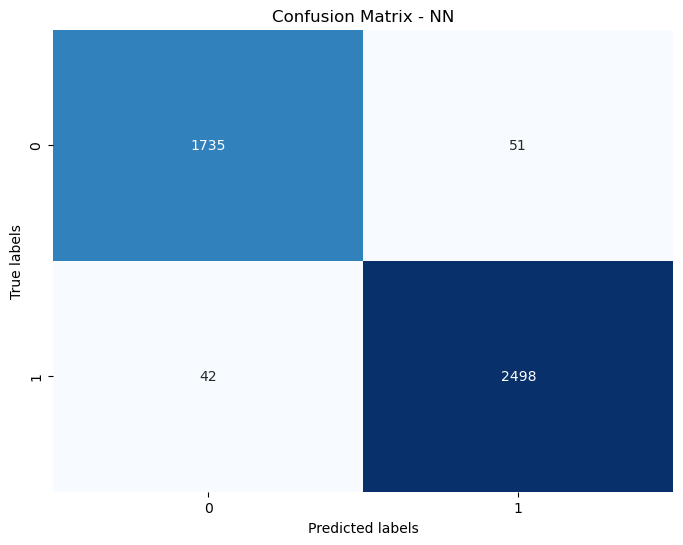

PCA dataset
Iteration 1, loss = 0.35557621
Iteration 2, loss = 0.03296537
Iteration 3, loss = 0.01317514
Iteration 4, loss = 0.00679692
Iteration 5, loss = 0.00335352
Iteration 6, loss = 0.00404679
Iteration 7, loss = 0.00831161
Iteration 8, loss = 0.01004926
Iteration 9, loss = 0.01162672
Iteration 10, loss = 0.01770985
Iteration 11, loss = 0.01251923
Iteration 12, loss = 0.00339524
Iteration 13, loss = 0.00240698
Iteration 14, loss = 0.00035743
Iteration 15, loss = 0.00017812
Iteration 16, loss = 0.00013166
Iteration 17, loss = 0.00010466
Iteration 18, loss = 0.00008651
Iteration 19, loss = 0.00007375
Iteration 20, loss = 0.00006422
Iteration 21, loss = 0.00005682
Iteration 22, loss = 0.00005099
Iteration 23, loss = 0.00004621
Iteration 24, loss = 0.00004231
Iteration 25, loss = 0.00003906
Iteration 26, loss = 0.00003631
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Accuracy: 0.9692556634304207


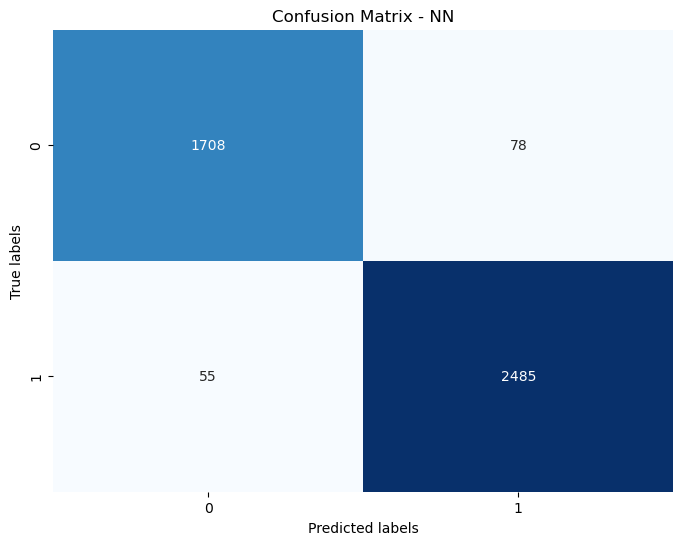

UMAP dataset
Iteration 1, loss = 1.19353971
Iteration 2, loss = 0.71362340
Iteration 3, loss = 0.69124472
Iteration 4, loss = 0.68692588
Iteration 5, loss = 0.70074846
Iteration 6, loss = 0.68251548
Iteration 7, loss = 0.68613804
Iteration 8, loss = 0.67979380
Iteration 9, loss = 0.68292546
Iteration 10, loss = 0.67389331
Iteration 11, loss = 0.69863572
Iteration 12, loss = 0.68292234
Iteration 13, loss = 0.67668223
Iteration 14, loss = 0.67495289
Iteration 15, loss = 0.67563940
Iteration 16, loss = 0.67650137
Iteration 17, loss = 0.67918015
Iteration 18, loss = 0.67691444
Iteration 19, loss = 0.68483084
Iteration 20, loss = 0.67813574
Iteration 21, loss = 0.67415576
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Accuracy: 0.5871474803513639


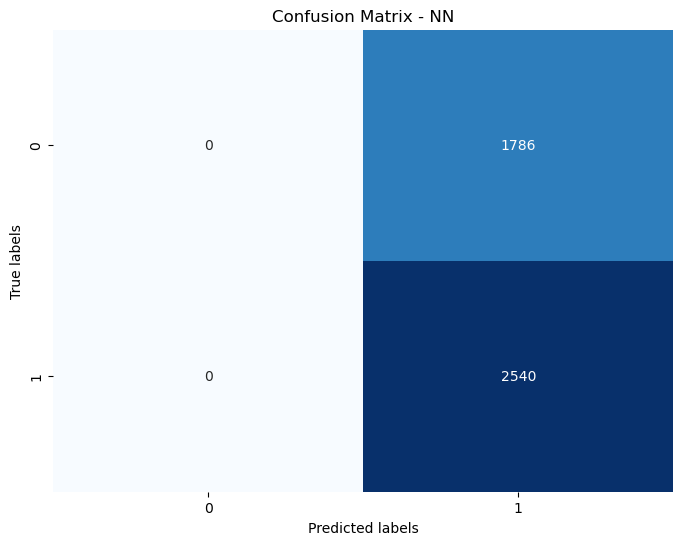

In [35]:
for x in dataset_dropseq.keys():
    print(x)
    nn_dropseq = run_nn(dataset_dropseq[x], n_epochs)
    filename = f"pickle/{tumor}/nn/dropseq_{x}"
    with open(filename, 'wb') as f:
        pickle.dump(nn_dropseq, f)
    print(f"Accuracy: {nn_dropseq['accuracy']}")
    plot_confusion_matrix(nn_dropseq, nn_dropseq['name'])

## Pipeline for model comparison

In [59]:
names = ['xgboost', 'knn', 'logreg', 'svm', 'rf', 'nn']

In [60]:
model_pipleline_smartseq = []

for name in names:
    filename = f"pickle/{tumor}/{name}/smartseq_merged dataset"
    with open(filename, 'rb') as f:
        model = pickle.load(f)
        model_pipleline_smartseq.append(model)

In [61]:
model_pipleline_dropseq = []

for name in names:
    filename = f"pickle/{tumor}/{name}/dropseq_merged dataset"
    with open(filename, 'rb') as f:
        model = pickle.load(f)
        model_pipleline_dropseq.append(model)

In [62]:
# Create a metric of comparison for the models
model_names = []
acc_list = []
prec_list_n = []
rec_list_n = []
f1_list_n = []
auc_list = []

for model in model_pipleline_smartseq:
    
    # Name 
    model_names.append(model['name'])

    # Accuracy
    acc = model['accuracy']
    acc_list.append(f"{acc}")
    # Precision
    prec = model['precision']
    prec_list_n.append(f"{prec.mean()}")
    # Recall
    rec = model['recall']
    rec_list_n.append(f"{rec.mean()}")
    # F1 score
    f1 = model['f1']
    f1_list_n.append(f"{f1.mean()}")
    # AUC score
    auc = model['auc']
    auc_list.append(f"{auc.mean()}")

data_smartseq = {
'Model': model_names,
'Accuracy': acc_list,
'Precision': prec_list_n,
'Recall': rec_list_n,
'F1 Score': f1_list_n,
'AUC Score': auc_list
}

df_smartseq = pd.DataFrame(data_smartseq)

# Display DataFrame
print(df_smartseq)


                 Model            Accuracy           Precision Recall  \
0              XGboost  0.9960000000000001  0.9629629629629629    1.0   
1                  KNN  0.9960000000000001                 1.0    1.0   
2  Logistic Regression                 1.0                 1.0    1.0   
3                  SVM  0.9960000000000001                 1.0    1.0   
4        Random Forest  0.9879999999999999                 1.0    1.0   
5                   NN                 1.0                 1.0    1.0   

             F1 Score           AUC Score  
0  0.9811320754716981  0.9791666666666667  
1                 1.0                 1.0  
2                 1.0                 1.0  
3                 1.0                 1.0  
4                 1.0                 1.0  
5                 1.0                 1.0  


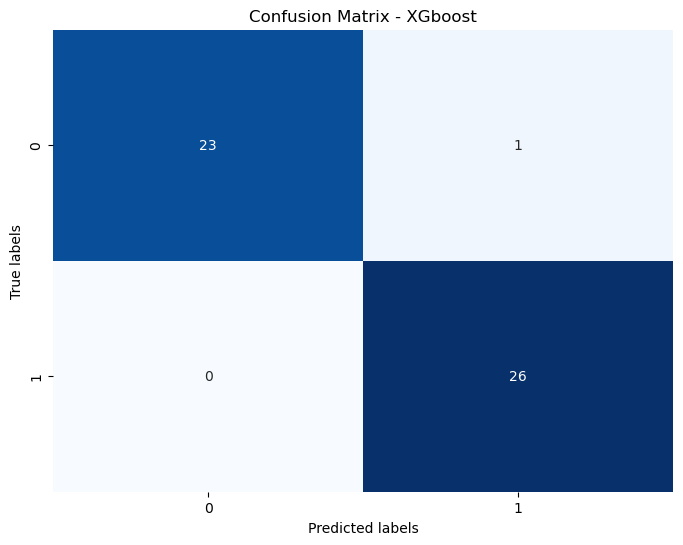

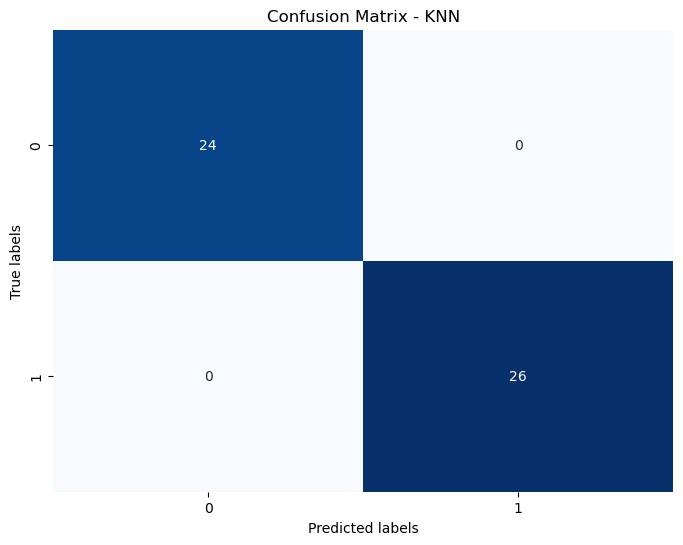

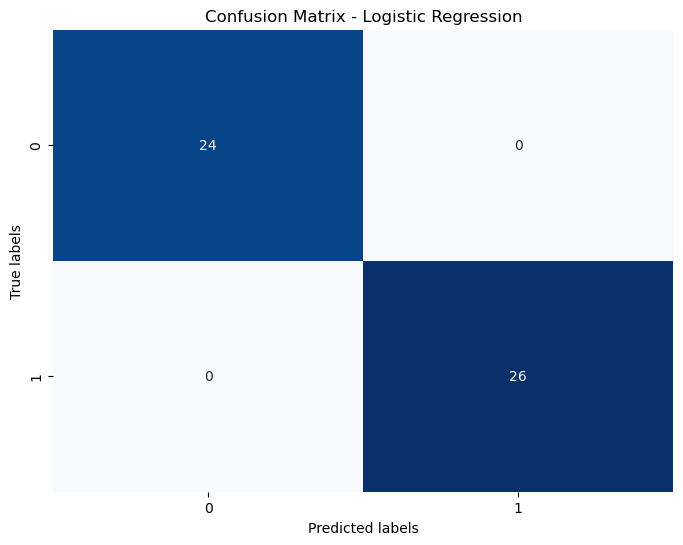

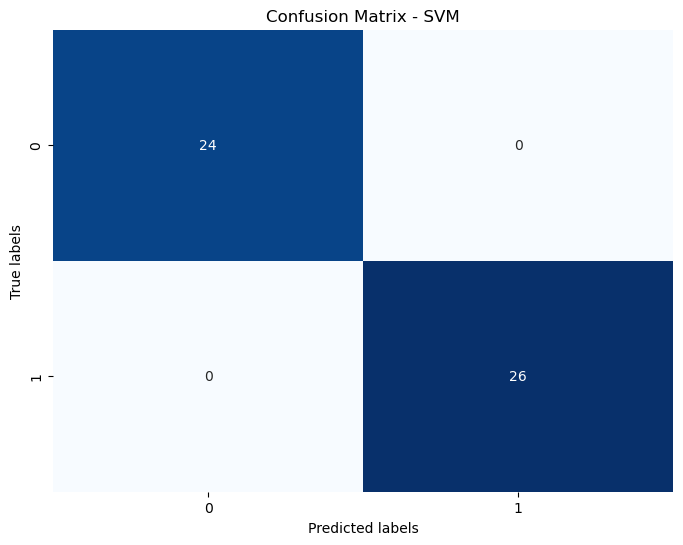

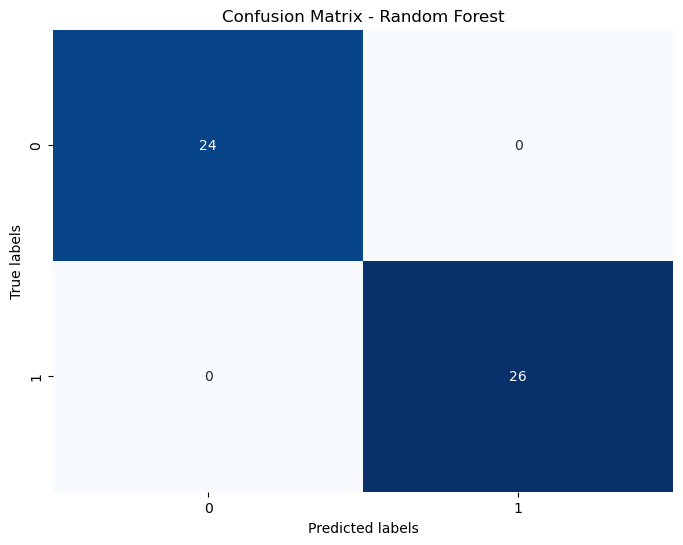

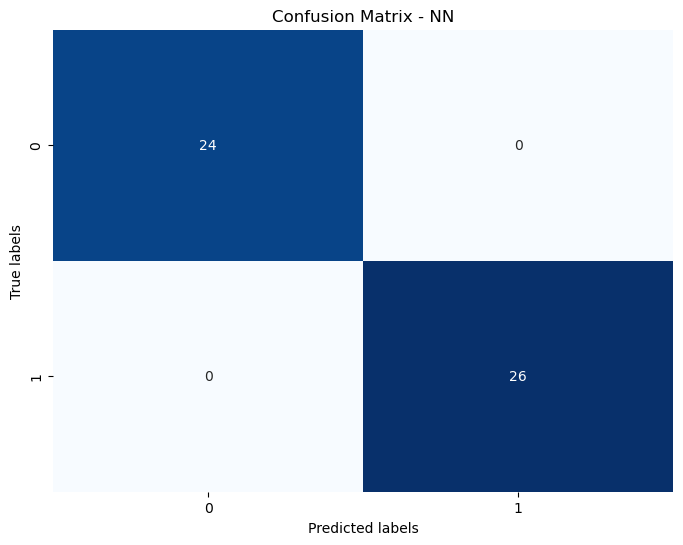

In [63]:
for i, model in enumerate(model_pipleline_smartseq):
    plot_confusion_matrix(model, model['name'])

In [64]:
# Create a metric of comparison for the models
model_names = []
acc_list = []
prec_list_n = []
rec_list_n = []
f1_list_n = []
auc_list = []

for model in model_pipleline_dropseq:
    
    # Name 
    model_names.append(model['name'])

    # Accuracy
    acc = model['accuracy']
    acc_list.append(f"{acc}")
    # Precision
    prec = model['precision']
    prec_list_n.append(f"{prec.mean()}")
    # Recall
    rec = model['recall']
    rec_list_n.append(f"{rec.mean()}")
    # F1 score
    f1 = model['f1']
    f1_list_n.append(f"{f1.mean()}")
    # AUC score
    auc = model['auc']
    auc_list.append(f"{auc.mean()}")

data_dropseq = {
'Model': model_names,
'Accuracy': acc_list,
'Precision': prec_list_n,
'Recall': rec_list_n,
'F1 Score': f1_list_n,
'AUC Score': auc_list
}

df_dropseq = pd.DataFrame(data_dropseq)

# Display DataFrame
print(df_dropseq)


                 Model            Accuracy           Precision  \
0              XGboost  0.9822898938799943  0.9774669774669774   
1                  KNN  0.8981787872228413  0.9687643546164446   
2  Logistic Regression  0.9802552224885689   0.981198589894242   
3                  SVM  0.9805789005315354   0.979711275848615   
4        Random Forest  0.9337838315976258  0.8939716312056738   
5                   NN   0.978502080443828  0.9799921537857984   

               Recall            F1 Score           AUC Score  
0  0.9905511811023622  0.9839655846695347  0.9790381885355036  
1  0.8303149606299213  0.8942124231503074  0.8961205262276147  
2  0.9862204724409449  0.9837031219320637  0.9796723862764635  
3  0.9885826771653543  0.9841269841269841  0.9797336678100007  
4    0.99251968503937  0.9406716417910448  0.9125532355767959  
5  0.9834645669291339  0.9817252898408332  0.9774545678990575  


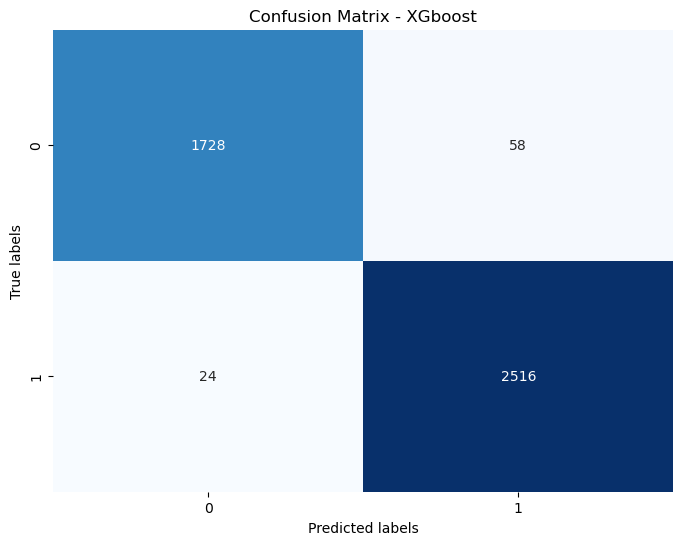

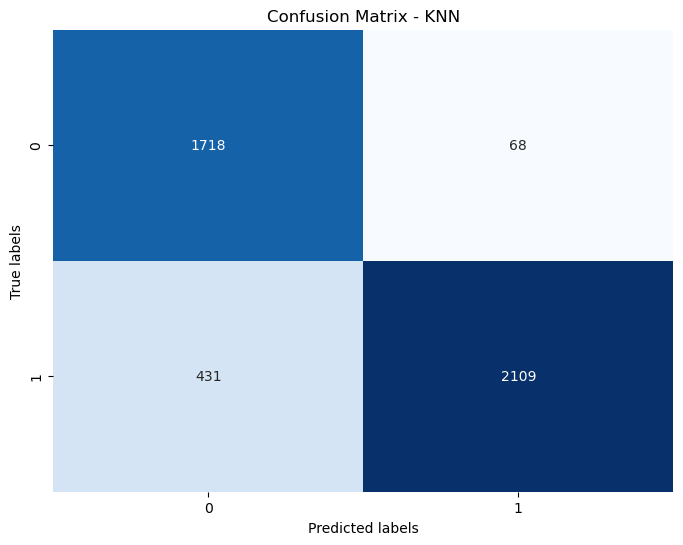

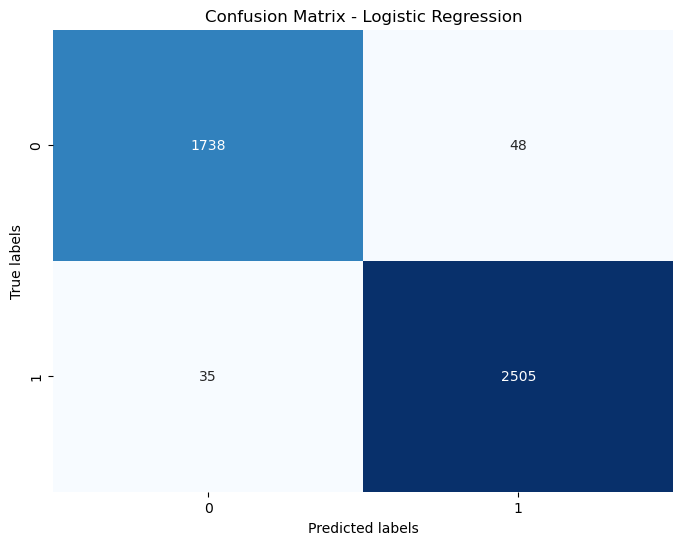

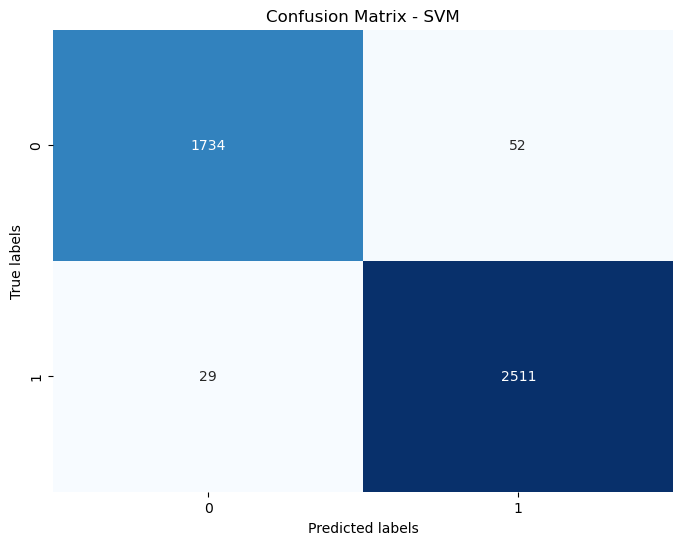

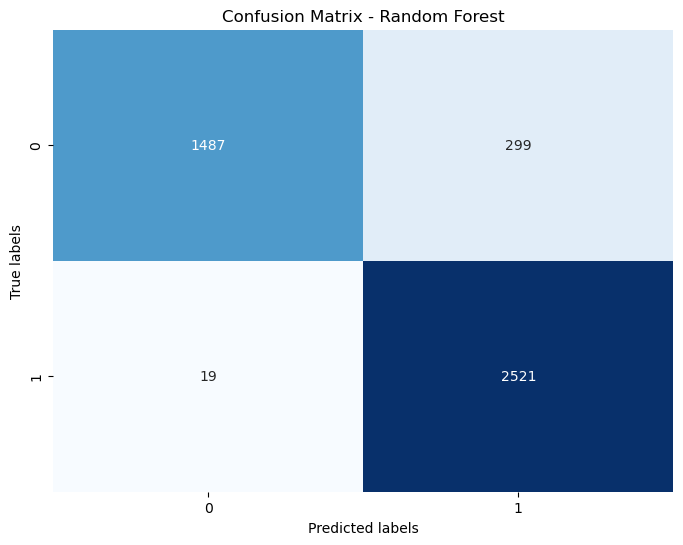

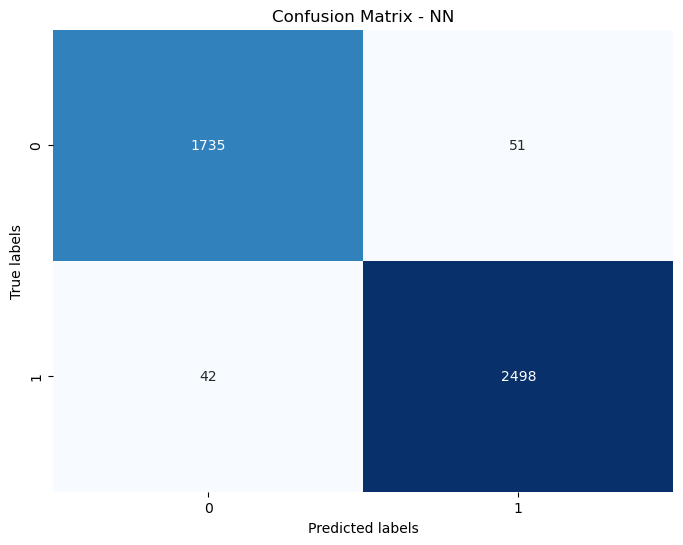

In [65]:
for i, model in enumerate(model_pipleline_dropseq):
    plot_confusion_matrix(model, model['name'])

## Ensemble method

In [66]:
names = ['xgboost', 'logreg', 'nn']

In [67]:
class Ensemble():
    def __init__(self, models):
        self.models = models

    def predict(self, X):
        predictions = np.column_stack([model.predict(X) for model in self.models.values()])
        return np.mean(predictions, axis=1).astype(int)

    def score(self, X, y):
        return accuracy_score(y, self.predict(X))

In [68]:
models = {}
X, y, X_train, X_test, y_train, y_test, kfold = load_dataset(merged_dropseq)

for name in names:
    print(name)
    filename = f"pickle/{tumor}/{name}/dropseq_merged dataset"
    with open(filename, 'rb') as f:
        result = pickle.load(f)
        models[name] = result['model']


ensemble_model = Ensemble(models)

# Make predictions
ensemble_predictions = ensemble_model.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, ensemble_predictions)
print("Accuracy:", accuracy)

# Create confusion matrix
conf_matrix = confusion_matrix(y_test, ensemble_predictions)
print("Confusion Matrix:\n", conf_matrix)

# Calculate Precision
precision = precision_score(y_test, ensemble_predictions)
print("Precision:", precision)

# Calculate Recall
recall = recall_score(y_test, ensemble_predictions)
print("Recall:", recall)

# Calculate F1-score
f1 = f1_score(y_test, ensemble_predictions)
print("F1-score:", f1)

# Calculate AUC
auc = roc_auc_score(y_test, ensemble_predictions)
print("AUC:", auc)

xgboost
logreg
nn
Accuracy: 0.9791955617198336
Confusion Matrix:
 [[1759   27]
 [  63 2477]]
Precision: 0.9892172523961661
Recall: 0.9751968503937007
F1-score: 0.9821570182394924
AUC: 0.9800396346033452


In [69]:
models = {}
X, y, X_train, X_test, y_train, y_test, kfold = load_dataset(merged_smartseq)

for name in names:
    print(name)
    filename = f"pickle/{tumor}/{name}/smartseq_merged dataset"
    with open(filename, 'rb') as f:
        result = pickle.load(f)
        models[name] = result['model']


ensemble_model = Ensemble(models)

# Make predictions
ensemble_predictions = ensemble_model.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, ensemble_predictions)
print("Accuracy:", accuracy)

# Create confusion matrix
conf_matrix = confusion_matrix(y_test, ensemble_predictions)
print("Confusion Matrix:\n", conf_matrix)

# Calculate Precision
precision = precision_score(y_test, ensemble_predictions)
print("Precision:", precision)

# Calculate Recall
recall = recall_score(y_test, ensemble_predictions)
print("Recall:", recall)

# Calculate F1-score
f1 = f1_score(y_test, ensemble_predictions)
print("F1-score:", f1)

# Calculate AUC
auc = roc_auc_score(y_test, ensemble_predictions)
print("AUC:", auc)

xgboost
logreg
nn
Accuracy: 1.0
Confusion Matrix:
 [[24  0]
 [ 0 26]]
Precision: 1.0
Recall: 1.0
F1-score: 1.0
AUC: 1.0
